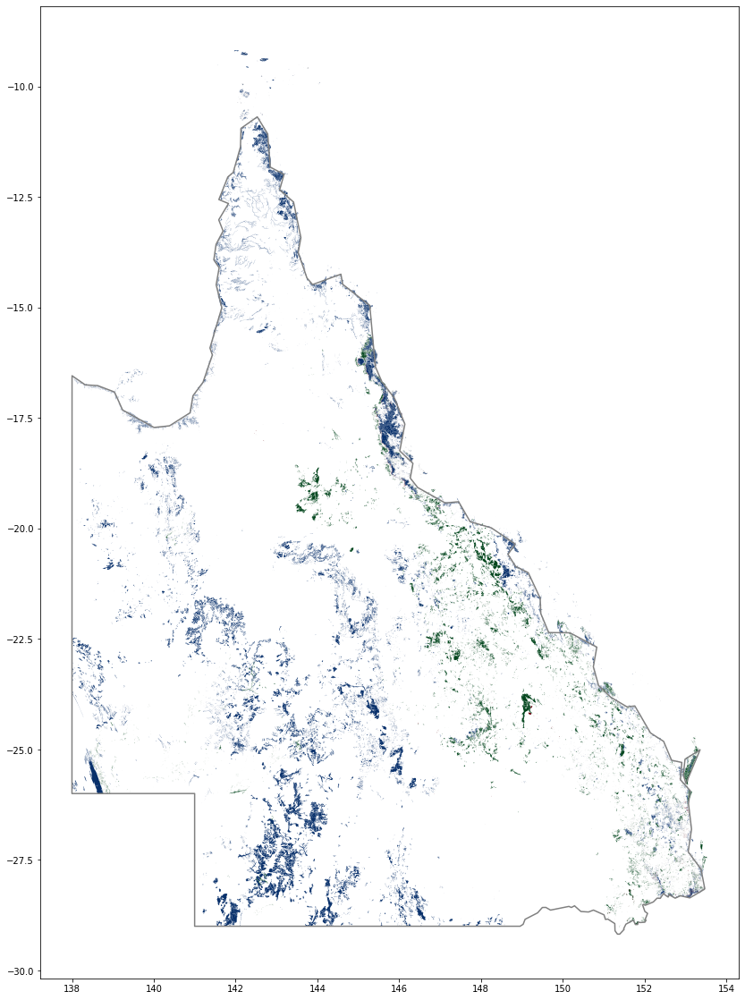

In [1]:
#import gdal
from osgeo import gdal
from numpy import *

import matplotlib.pyplot as plt
%matplotlib inline

import rasterio
from rasterio import plot

from spectral import *
import spectral.io.envi

from rasterio.plot import show

import pandas as pd
import geopandas

import shapely
from shapely.geometry import Point
from shapely.geometry import Polygon
from shapely.geometry import MultiPolygon
from shapely import wkt
from shapely.geometry import shape, mapping

#import shapely.wkt
import shapely.geometry as geometry

noneuc = geopandas.read_file("Non_Eucalyptus_Reg_Ecos_2017/Non_Eucalypt_RE.shp")
euc = geopandas.read_file("Monospecies_Reg_Ecos_2017/FF_SingleSp_RE_2017_V11.shp")
eucmg = geopandas.read_file("Monogenus_Monotribe_Eucalypt_Reg_Ecos_2017/Monotribe_Eucalypt_REs_2017_100pct.shp")

ucl = euc['QLD_REG_EC'].unique().tolist()
uclm = eucmg['RE'].unique().tolist()

uclb = ucl + uclm

euco = {k: v for v, k in enumerate(ucl)} 

nonucl = noneuc['RE'].unique().tolist()
noneuco = {k: v for v, k in enumerate(nonucl)}

zg = {**euco, **noneuco}
import copy
zgz = copy.deepcopy(zg)
counter = 10
zk = list(zgz.keys())
for p in range(0,len(zgz)):
    zgz[zk[p]] = counter
    counter += 1
    
    
import json
from shapely.geometry import shape, GeometryCollection

with open("australian-states.json") as f:
    features = json.load(f)["features"]

# NOTE: buffer(0) is a trick for fixing scenarios where polygons have overlapping coordinates 
x = GeometryCollection([shape(feature["geometry"]).buffer(0) for feature in features])

queensland = x[2]

cmap_reds=plt.cm.get_cmap('Reds', 2)
cmap_blues=plt.cm.get_cmap('Blues', 2)
cmap_greens=plt.cm.get_cmap('Greens', 2)

fg=20

queensland_gs = geopandas.GeoSeries(queensland)
ax = queensland_gs.geometry.boundary.plot(color='grey',figsize=(fg,fg))
#ax = queensland.plot(color='black',figsize=(fg,fg))

noneuc.plot(ax=ax,color=cmap_blues(2),figsize=(fg,fg))
euc.plot(ax=ax,color=cmap_reds(2),figsize=(fg,fg))
eucmg.plot(ax=ax,color=cmap_greens(2),figsize=(fg,fg))

In [120]:
def point2rect(lon,lat,inc):
    l = lon - inc
    b = lat - inc
    r = lon + inc 
    t = lat + inc
    #print("---------lbrt-------------")
    #print(l,b,r,t)                                  
    spoly = Polygon([(l,t),(l,b),(r,b),(r,t),(l,t)])
    return(spoly)

from geopandas import GeoSeries

def plot_in_poly(poly,fg,pname):
    subset2m = eucmg[eucmg.intersects(poly)]
    subset2 = euc[euc.intersects(poly)]
    subset2ne = noneuc[noneuc.intersects(poly)]
    ax = subset2.plot(color='white',figsize=(fg,fg))

    cmap_reds=plt.cm.get_cmap('Reds', 2)
    cmap_blues=plt.cm.get_cmap('Blues', 2)
    cmap_greens=plt.cm.get_cmap('Greens', 2)

    subset2x = subset2
    subset2x.plot(ax=ax,color=cmap_reds(2),figsize=(fg,fg))

    subset2x = subset2ne
    subset2x.plot(ax=ax,color=cmap_blues(2),figsize=(fg,fg))
    
    gp = GeoSeries([poly])
    gp.plot(ax=ax,color="none",edgecolor="black",figsize=(fg,fg))
    ax.annotate(s=pname, xy=poly.centroid.coords[0], ha='center')
    
    subset2x = subset2m
    subset2x.plot(ax=ax,color=cmap_greens(2),figsize=(fg,fg))

    
def poly_polycount(poly,fg):
    subset2m = eucmg[eucmg.intersects(poly)]
    subset2 = euc[euc.intersects(poly)]
    subset2ne = noneuc[noneuc.intersects(poly)]
    return([(len(subset2m)+len(subset2)),len(subset2ne)])


def poly_polycount_area(poly,fg):
    ea = 0
    nea = 0
    subset2m = eucmg[eucmg.intersects(poly)]
    for i in range(0,len(subset2m)):
        ea += subset2m.iloc[[i]].geometry.area.values[0]
    #subset2 = euc[euc.intersects(poly)]
    #if(len(subset2)>0):
    #    for i in subset2:
    #        ea += subset2.iloc[[i]].geometry.area.values[0]
    subset2ne = noneuc[noneuc.intersects(poly)]
    for i in subset2ne:
        nea += subset2ne.iloc[[i]].geometry.area.values[0]
    return([(len(subset2m)+len(subset2)),len(subset2ne),ea,nea])
    
    
    
def plot_in_poly_con(poly,fg):
    subset2m = eucmg[eucmg.intersects(poly)]
    subset2 = euc[euc.intersects(poly)]
    subset2ne = noneuc[noneuc.intersects(poly)]
    if( len(subset2ne)>0):
        ax = subset2.plot(color='white',figsize=(fg,fg))

        cmap_reds=plt.cm.get_cmap('Reds', 2)
        cmap_blues=plt.cm.get_cmap('Blues', 2)
        cmap_greens=plt.cm.get_cmap('Greens', 2)

        subset2x = subset2
        subset2x.plot(ax=ax,color=cmap_reds(2),figsize=(fg,fg))

        subset2x = subset2ne
        subset2x.plot(ax=ax,color=cmap_blues(2),figsize=(fg,fg))

        subset2x = subset2m
        subset2x.plot(ax=ax,color=cmap_greens(2),figsize=(fg,fg))

In [101]:
emgarea = []
emgl = []
ind = []
rat = []
rep = []
for p in range(1,34367):
    a = eucmg.iloc[[p]].geometry.area.values[0]
    l = eucmg.iloc[[p]].geometry.length.values[0]
    emgarea.append(a)
    emgl.append(l)
    rat.append(l/a)
    #ind.append(eucmg.iloc[[p]].index)
    rep.append(eucmg.iloc[[p]].geometry.representative_point().values[0])
    

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  import sys
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  


In [30]:
x = eucmg.iloc[[p]].geometry.area
type(x)

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  """Entry point for launching an IPython kernel.


pandas.core.series.Series

In [34]:
print(x.values[0])

0.00030055657956383795


In [60]:
emgdf = pd.DataFrame(list(zip(rat,emgarea,emgl,rep)), columns =['ratio','area','length', 'point'])
#emgdfl = pd.DataFrame(list(zip(rat,emgarea,emgl)), columns =['ratio','area','length'])

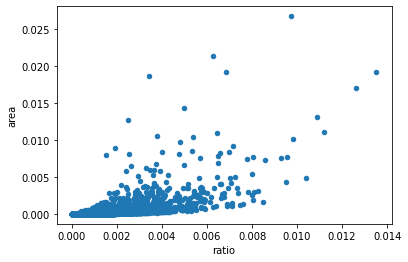

In [103]:
emgdf.plot.scatter(x="ratio",y="area")

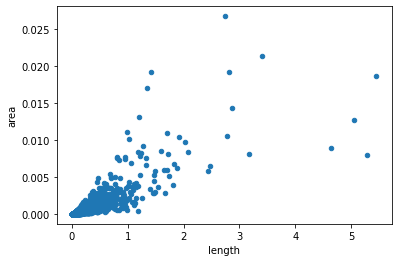

In [102]:
emgdf.plot.scatter(x="length",y="area")

In [104]:
emgdf.to_csv("eucmg_polygon_stats.csv",index=False)

In [ ]:
# pick reppoints, expand with buffer, use intersection on 

In [128]:
emgdfss = emgdf[emgdf.area > 0.002]
len(emgdfss)

148

In [129]:
emgdfss

,ratio,area,length,point
46,0.006597,0.008205,1.243762,POINT (143.9059968724023 -19.31557833949995)
50,0.005381,0.010343,1.922041,POINT (143.8423910510986 -19.28246312199997)
51,0.003762,0.010462,2.781108,POINT (143.9140006261037 -19.72846913149996)
181,0.003807,0.003055,0.802500,POINT (144.3060102079177 -19.23235915549995)
206,0.004080,0.002439,0.597887,POINT (142.5674257686954 -27.97503313749996)
...,...,...,...,...
34272,0.007808,0.002933,0.375654,POINT (143.8141595849157 -19.14414171899995)
34273,0.005120,0.003490,0.681715,POINT (144.2249661633036 -19.22437142949994)
34287,0.004737,0.002470,0.521337,POINT (149.0414692475297 -24.44824365549997)
34297,0.003559,0.002529,0.710564,POINT (151.0668160240007 -24.40865294299994)


In [132]:
emgdfss.to_csv("eucPoly_g731.csv")


In [133]:
for c in range(0,148):
    i = emgdfss.index[c]
    a = emgdf.loc[[i]].point.values[0]._get_coords()[0][0]
    o = emgdf.loc[[i]].point.values[0]._get_coords()[0][1]
    npolt = point2rect(a,o,0.25)
    if(poly_polycount(npolt,12)[1]>3):
        #plot_in_poly(npolt,10,str(c))
        gj = geopandas.GeoSeries([npolt]).to_json()
        f = open('/Users/brian/code/Eucalyptus_GLMClassifier/LandSat8_Loc'+str(i)+'_g731.json', 'w')
        f.write(gj)
        f.close()

python3 order_api_landsat.py LandSat8_Loc206_g731.json 1-Dec-19 30-Dec-19 loc206Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc207_g731.json 1-Dec-19 30-Dec-19 loc207Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc221_g731.json 1-Dec-19 30-Dec-19 loc221Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc813_g731.json 1-Dec-19 30-Dec-19 loc813Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc1510_g731.json 1-Dec-19 30-Dec-19 loc1510Dec19
python3 order_api_landsat.py LandSat8_Loc1715_g731.json 1-Dec-19 30-Dec-19 loc1715Dec19
python3 order_api_landsat.py LandSat8_Loc1718_g731.json 1-Dec-19 30-Dec-19 loc1718Dec19


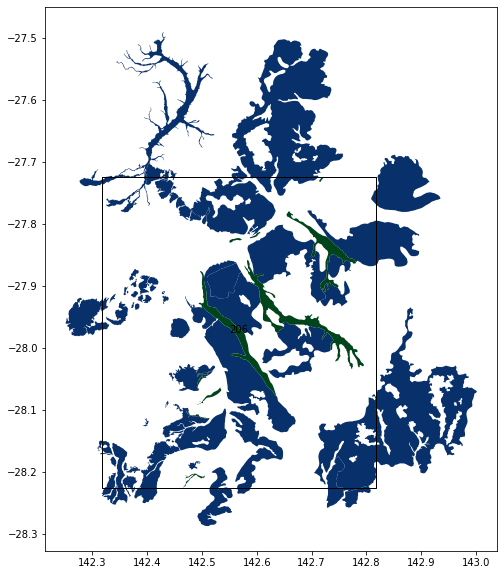

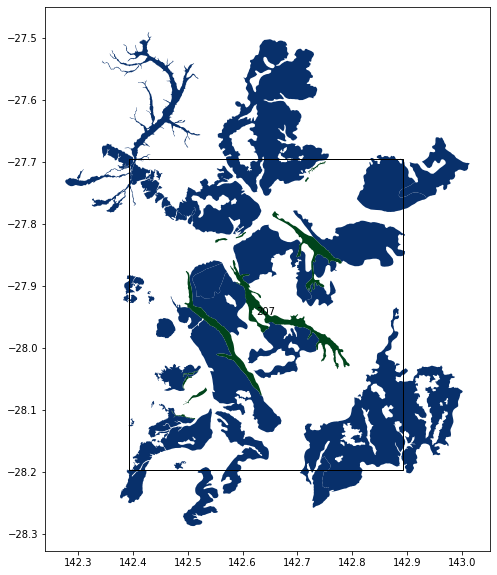

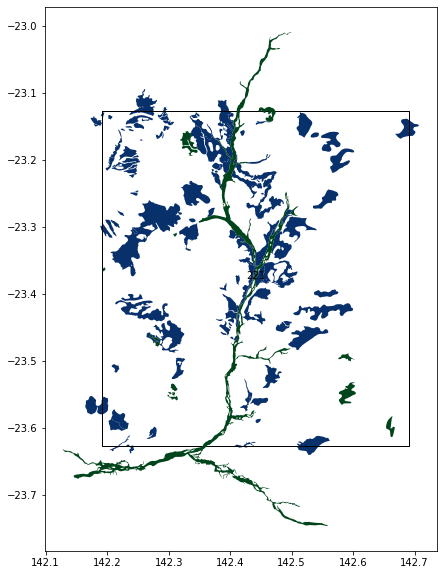

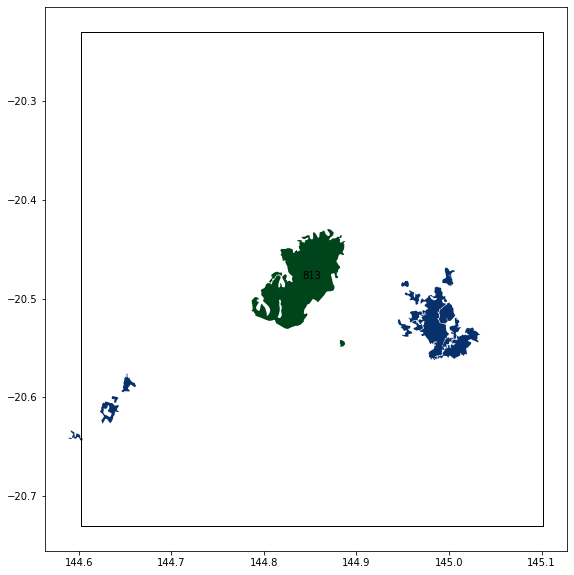

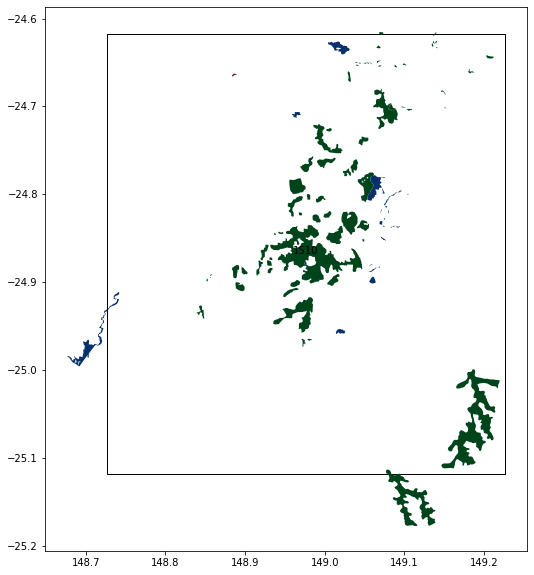

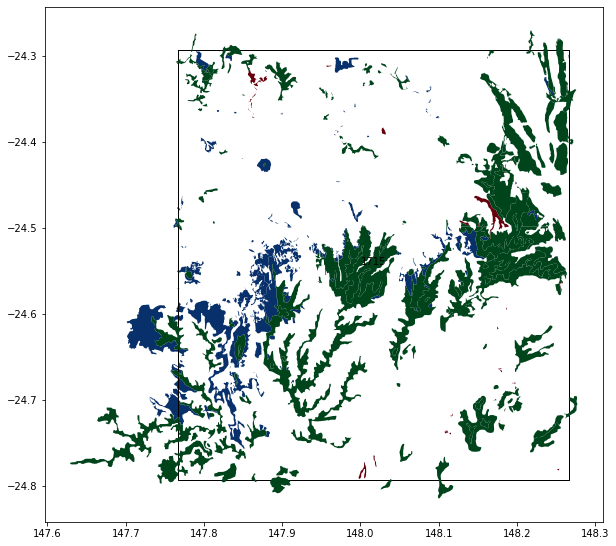

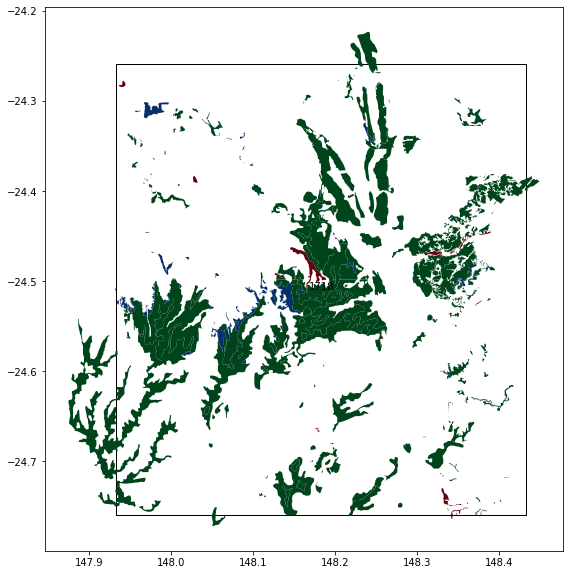

In [135]:
for c in range(0,15):
    i = emgdfss.index[c]
    a = emgdf.loc[[i]].point.values[0]._get_coords()[0][0]
    o = emgdf.loc[[i]].point.values[0]._get_coords()[0][1]
    npolt = point2rect(a,o,0.25)
    if(poly_polycount(npolt,12)[1]>3):
        print(f"python3 order_api_landsat.py LandSat8_Loc{i}_g731.json 1-Dec-19 30-Dec-19 loc{i}Dec19")
        plot_in_poly(npolt,10,str(i))
        

python3 order_api_landsat.py LandSat8_Loc1744_g731.json 1-Dec-19 30-Dec-19 loc1744Dec19
python3 order_api_landsat.py LandSat8_Loc1823_g731.json 1-Dec-19 30-Dec-19 loc1823Dec19
python3 order_api_landsat.py LandSat8_Loc1862_g731.json 1-Dec-19 30-Dec-19 loc1862Dec19
python3 order_api_landsat.py LandSat8_Loc1863_g731.json 1-Dec-19 30-Dec-19 loc1863Dec19
python3 order_api_landsat.py LandSat8_Loc1874_g731.json 1-Dec-19 30-Dec-19 loc1874Dec19
python3 order_api_landsat.py LandSat8_Loc1885_g731.json 1-Dec-19 30-Dec-19 loc1885Dec19
python3 order_api_landsat.py LandSat8_Loc1929_g731.json 1-Dec-19 30-Dec-19 loc1929Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc1939_g731.json 1-Dec-19 30-Dec-19 loc1939Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc1981_g731.json 1-Dec-19 30-Dec-19 loc1981Dec19
python3 order_api_landsat.py LandSat8_Loc1986_g731.json 1-Dec-19 30-Dec-19 loc1986Dec19
python3 order_api_landsat.py LandSat8_Loc2915_g731.json 1-Dec-19 30-Dec-19 loc2915Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc3592_g731.json 1-Dec-19 30-Dec-19 loc3592Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc4033_g731.json 1-Dec-19 30-Dec-19 loc4033Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc4259_g731.json 1-Dec-19 30-Dec-19 loc4259Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc4620_g731.json 1-Dec-19 30-Dec-19 loc4620Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


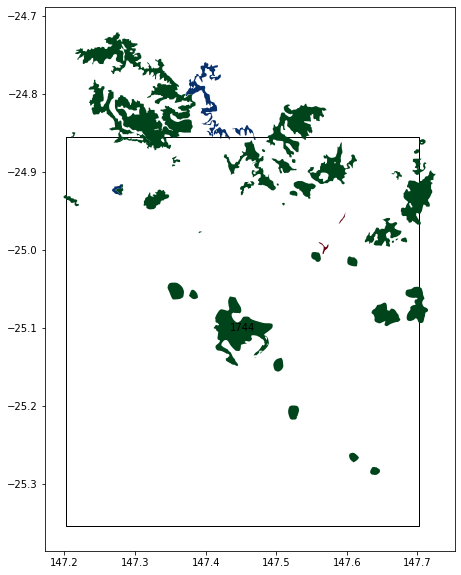

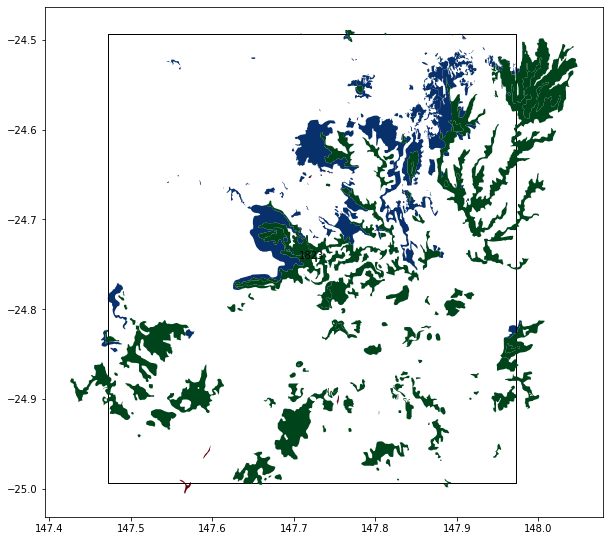

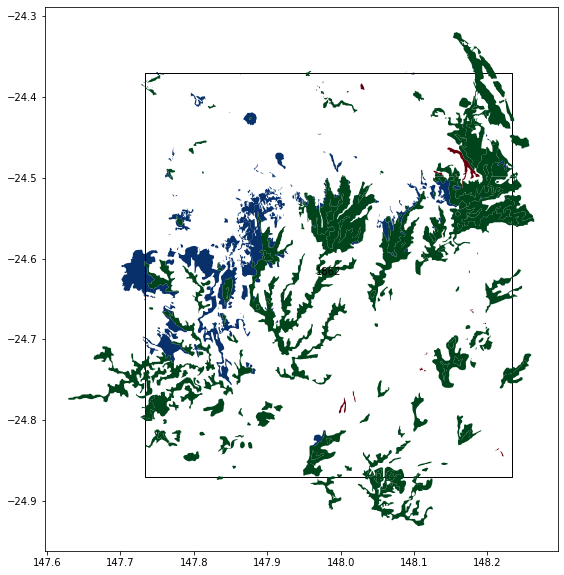

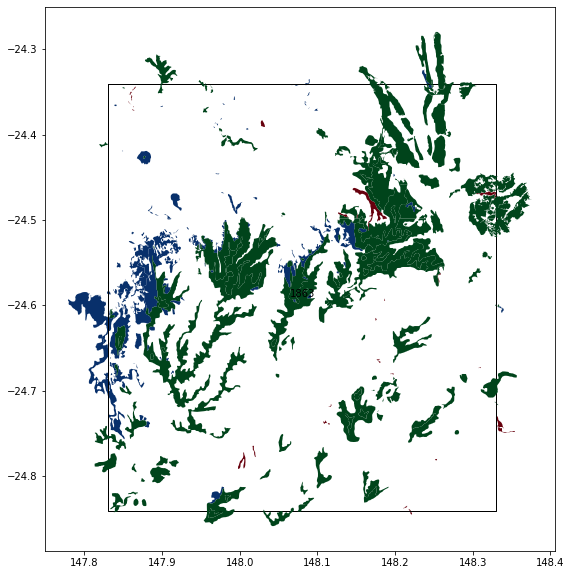

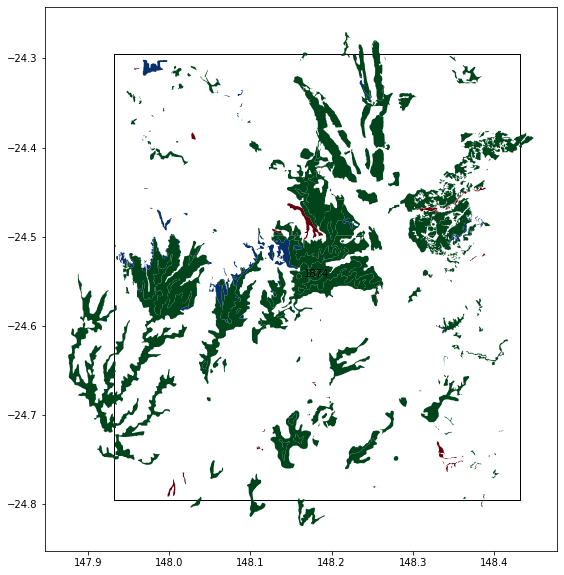

...

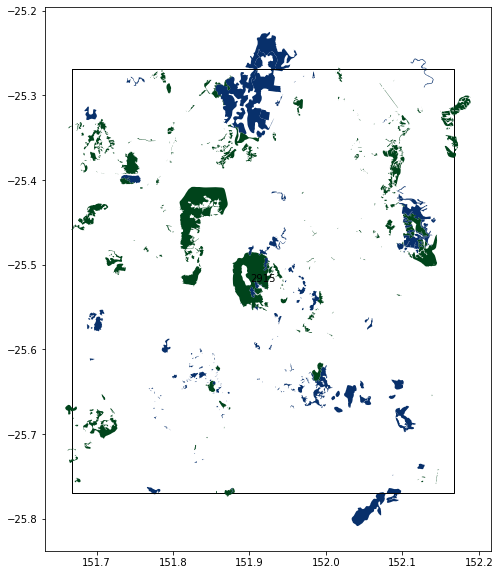

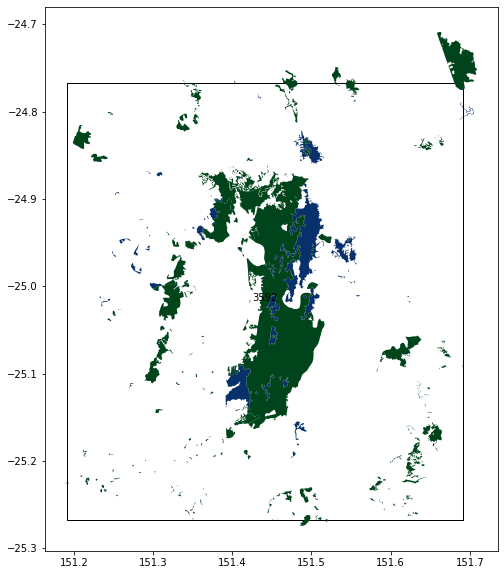

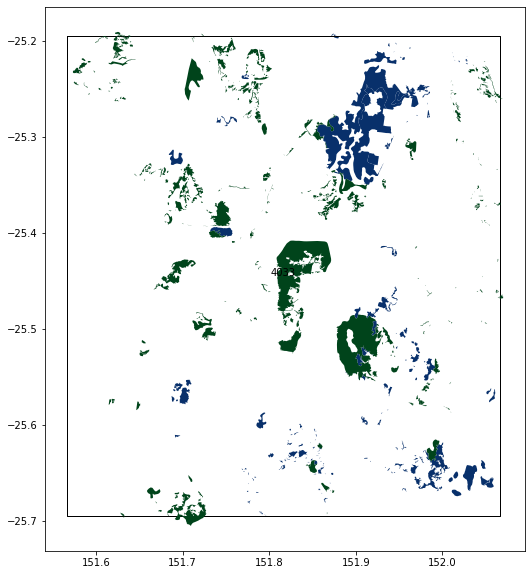

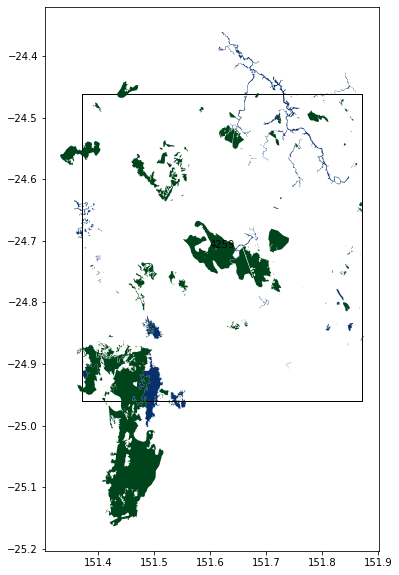

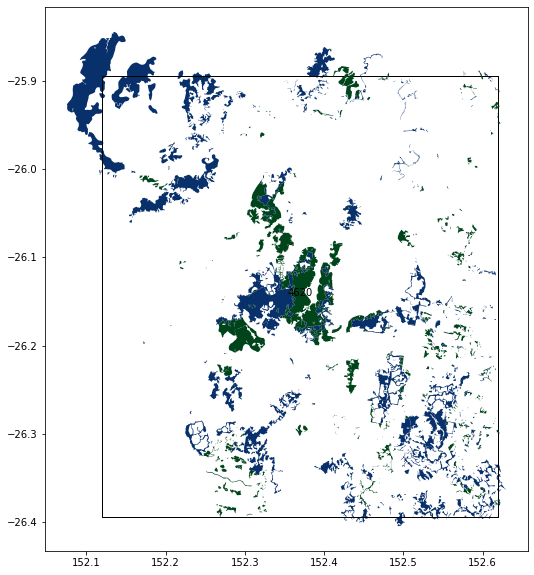

In [136]:
for c in range(15,30):
    i = emgdfss.index[c]
    a = emgdf.loc[[i]].point.values[0]._get_coords()[0][0]
    o = emgdf.loc[[i]].point.values[0]._get_coords()[0][1]
    npolt = point2rect(a,o,0.25)
    if(poly_polycount(npolt,12)[1]>3):
        print(f"python3 order_api_landsat.py LandSat8_Loc{i}_g731.json 1-Dec-19 30-Dec-19 loc{i}Dec19")
        plot_in_poly(npolt,10,str(i))
        

python3 order_api_landsat.py LandSat8_Loc5079_g731.json 1-Dec-19 30-Dec-19 loc5079Dec19
python3 order_api_landsat.py LandSat8_Loc5541_g731.json 1-Dec-19 30-Dec-19 loc5541Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc7039_g731.json 1-Dec-19 30-Dec-19 loc7039Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc7608_g731.json 1-Dec-19 30-Dec-19 loc7608Dec19
python3 order_api_landsat.py LandSat8_Loc8871_g731.json 1-Dec-19 30-Dec-19 loc8871Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc8952_g731.json 1-Dec-19 30-Dec-19 loc8952Dec19
python3 order_api_landsat.py LandSat8_Loc8953_g731.json 1-Dec-19 30-Dec-19 loc8953Dec19
python3 order_api_landsat.py LandSat8_Loc8957_g731.json 1-Dec-19 30-Dec-19 loc8957Dec19
python3 order_api_landsat.py LandSat8_Loc8980_g731.json 1-Dec-19 30-Dec-19 loc8980Dec19
python3 order_api_landsat.py LandSat8_Loc9022_g731.json 1-Dec-19 30-Dec-19 loc9022Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc9072_g731.json 1-Dec-19 30-Dec-19 loc9072Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc11346_g731.json 1-Dec-19 30-Dec-19 loc11346Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc14773_g731.json 1-Dec-19 30-Dec-19 loc14773Dec19
python3 order_api_landsat.py LandSat8_Loc14864_g731.json 1-Dec-19 30-Dec-19 loc14864Dec19
python3 order_api_landsat.py LandSat8_Loc18186_g731.json 1-Dec-19 30-Dec-19 loc18186Dec19


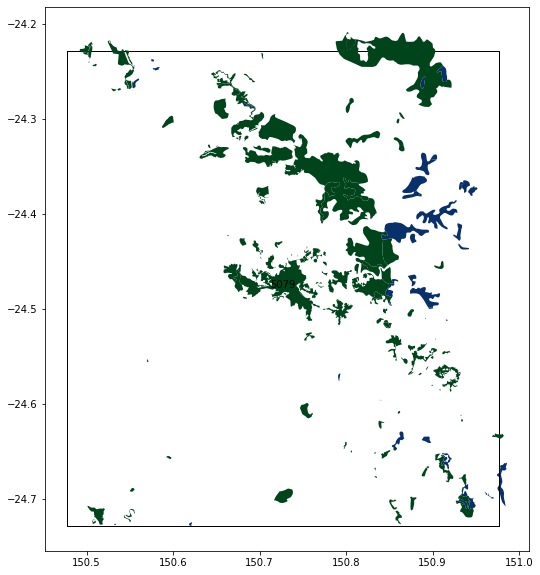

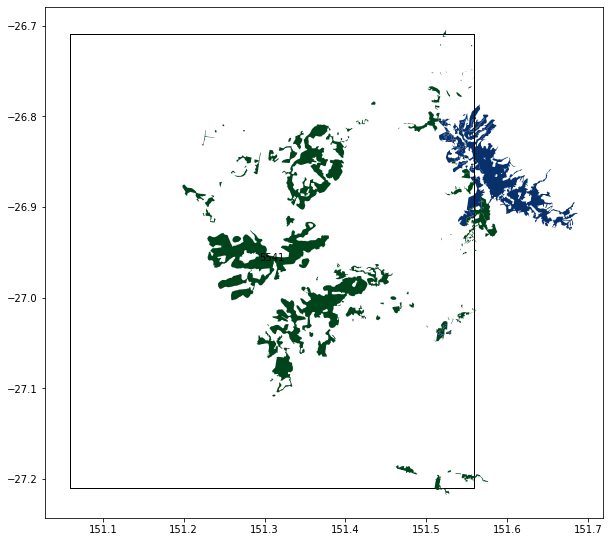

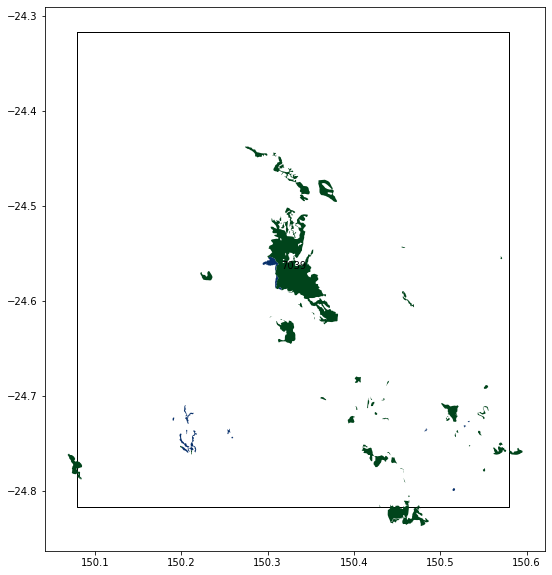

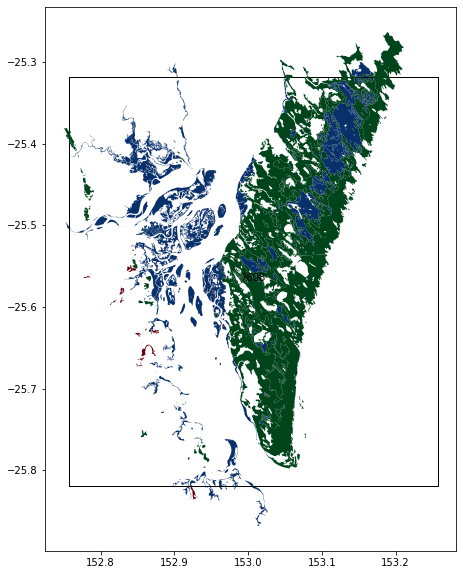

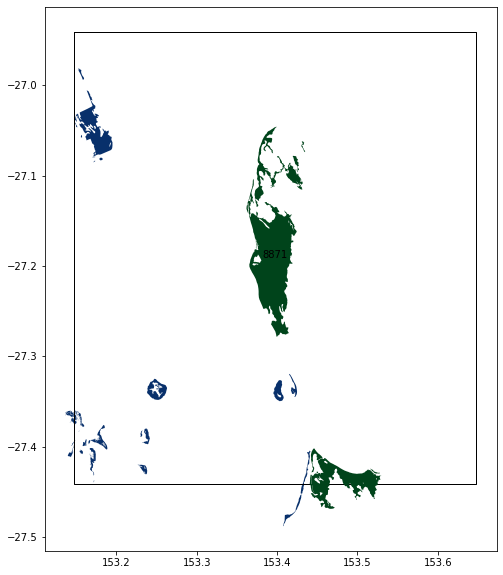

...

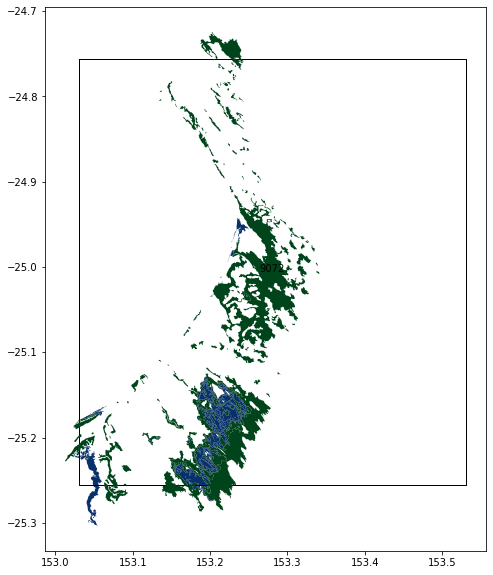

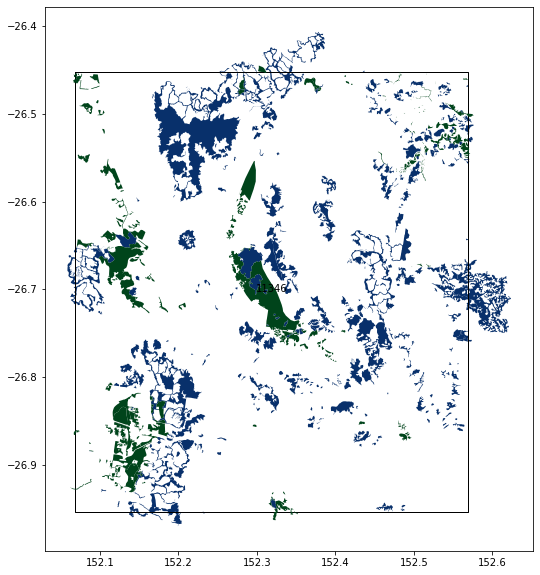

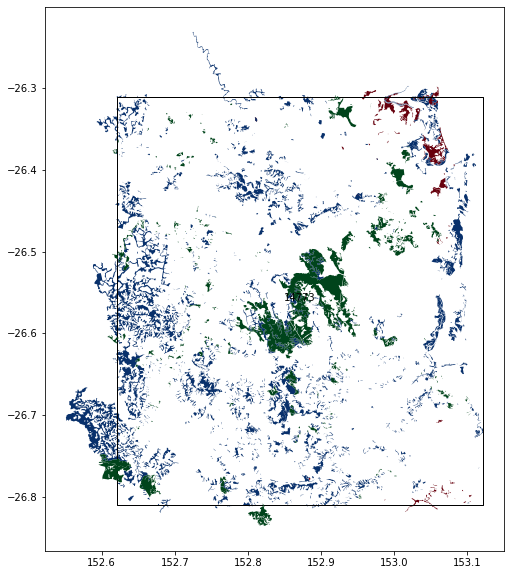

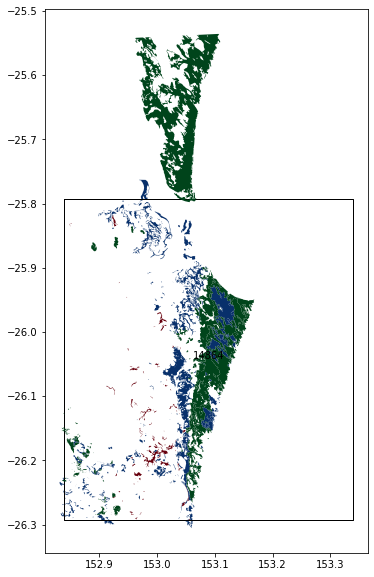

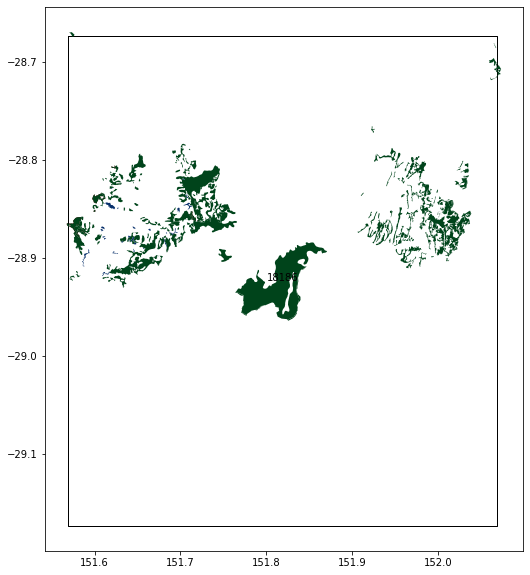

In [137]:
for c in range(30,45):
    i = emgdfss.index[c]
    a = emgdf.loc[[i]].point.values[0]._get_coords()[0][0]
    o = emgdf.loc[[i]].point.values[0]._get_coords()[0][1]
    npolt = point2rect(a,o,0.25)
    if(poly_polycount(npolt,12)[1]>3):
        print(f"python3 order_api_landsat.py LandSat8_Loc{i}_g731.json 1-Dec-19 30-Dec-19 loc{i}Dec19")
        plot_in_poly(npolt,10,str(i))
        

python3 order_api_landsat.py LandSat8_Loc18892_g731.json 1-Dec-19 30-Dec-19 loc18892Dec19
python3 order_api_landsat.py LandSat8_Loc18897_g731.json 1-Dec-19 30-Dec-19 loc18897Dec19
python3 order_api_landsat.py LandSat8_Loc18978_g731.json 1-Dec-19 30-Dec-19 loc18978Dec19
python3 order_api_landsat.py LandSat8_Loc19054_g731.json 1-Dec-19 30-Dec-19 loc19054Dec19
python3 order_api_landsat.py LandSat8_Loc19531_g731.json 1-Dec-19 30-Dec-19 loc19531Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc19605_g731.json 1-Dec-19 30-Dec-19 loc19605Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc19714_g731.json 1-Dec-19 30-Dec-19 loc19714Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


python3 order_api_landsat.py LandSat8_Loc19771_g731.json 1-Dec-19 30-Dec-19 loc19771Dec19
python3 order_api_landsat.py LandSat8_Loc19799_g731.json 1-Dec-19 30-Dec-19 loc19799Dec19
python3 order_api_landsat.py LandSat8_Loc19999_g731.json 1-Dec-19 30-Dec-19 loc19999Dec19


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


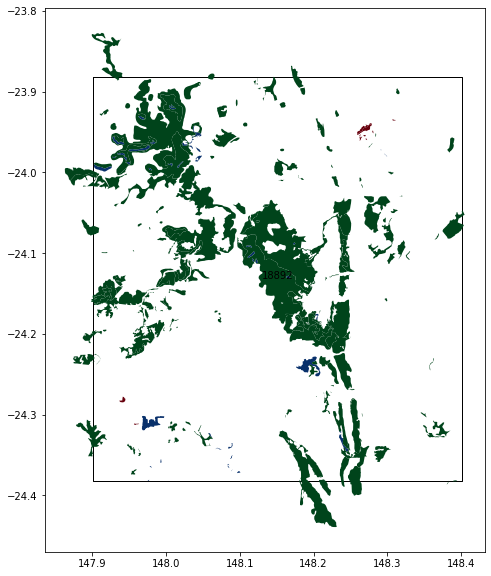

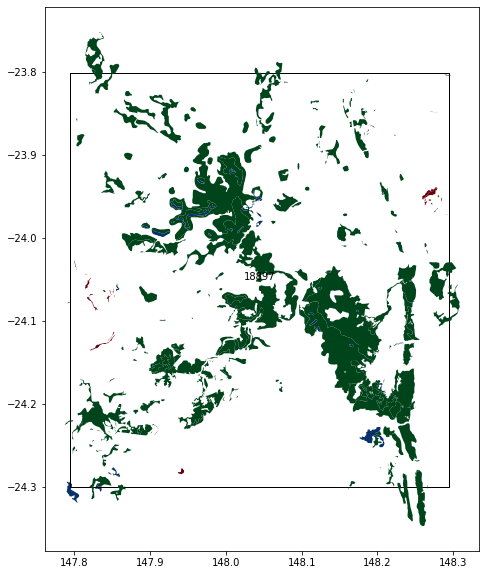

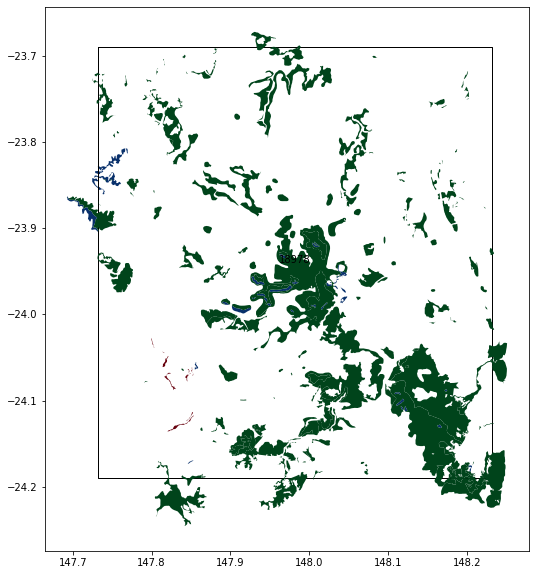

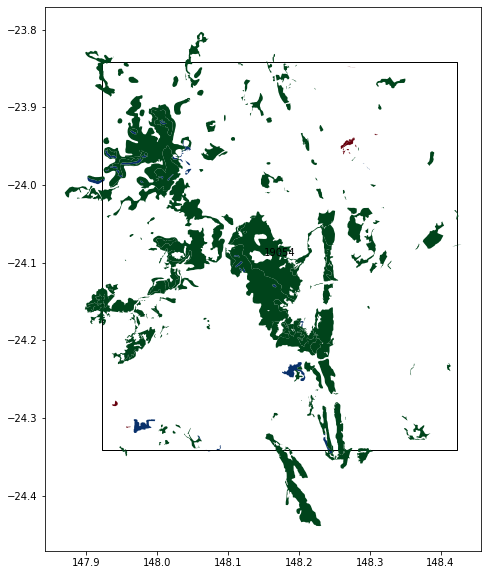

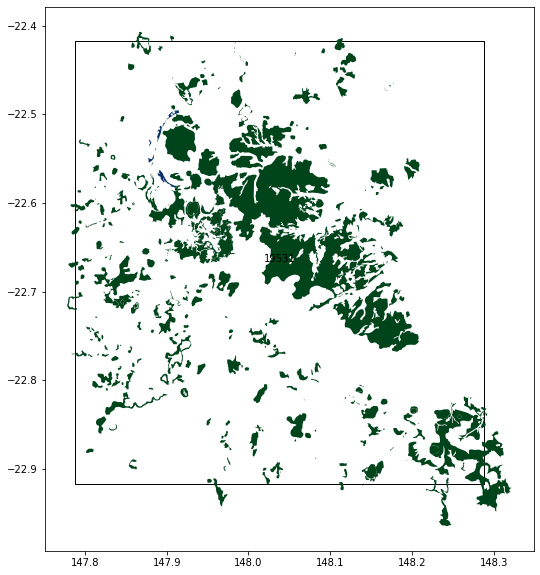

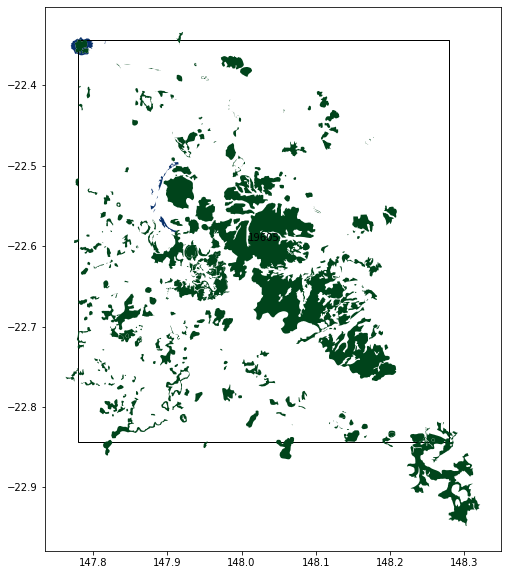

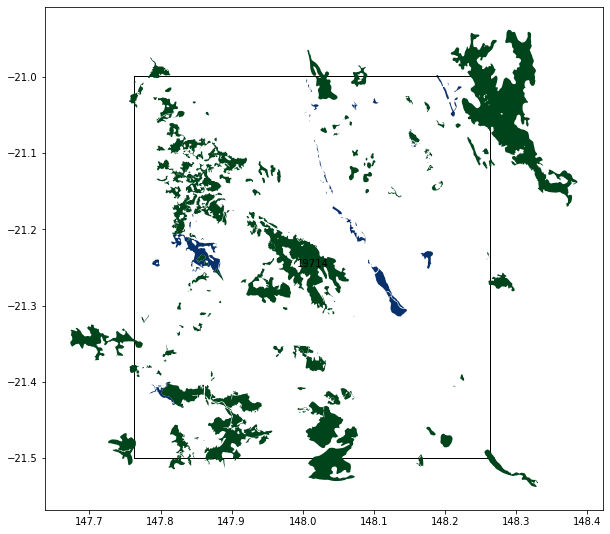

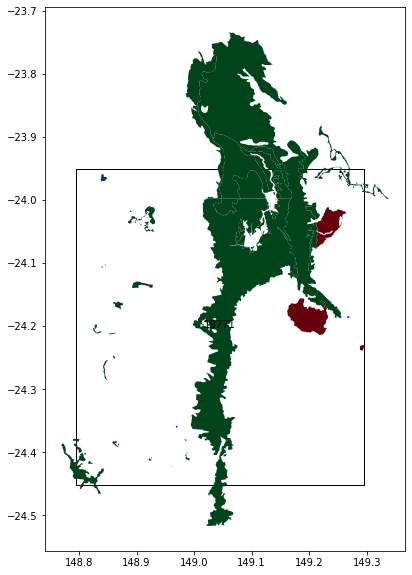

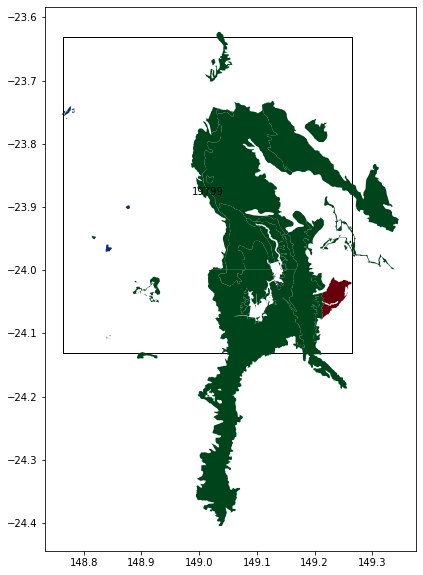

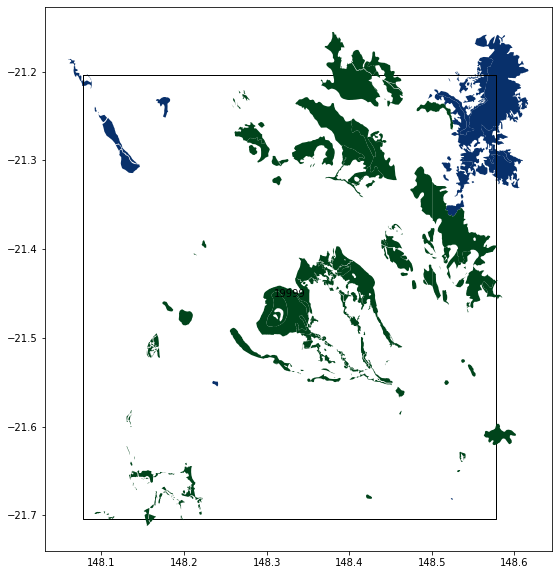

In [138]:
for c in range(45,60):
    i = emgdfss.index[c]
    a = emgdf.loc[[i]].point.values[0]._get_coords()[0][0]
    o = emgdf.loc[[i]].point.values[0]._get_coords()[0][1]
    npolt = point2rect(a,o,0.25)
    if(poly_polycount(npolt,12)[1]>3):
        print(f"python3 order_api_landsat.py LandSat8_Loc{i}_g731.json 1-Dec-19 30-Dec-19 loc{i}Dec19")
        plot_in_poly(npolt,10,str(i))
        

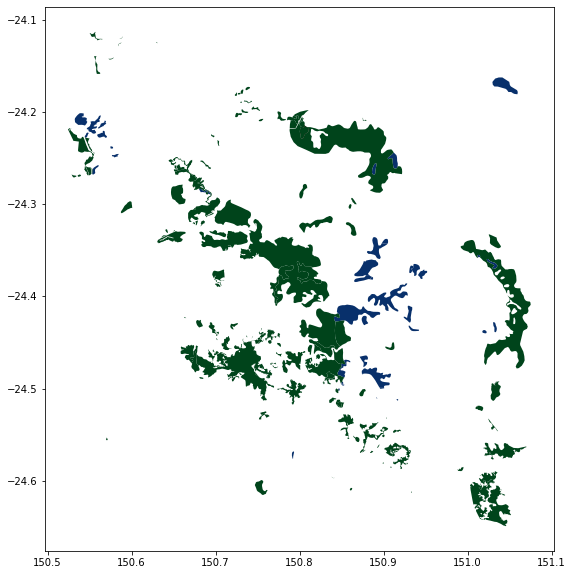

In [74]:
i = 34300
a = emgdf.loc[[i]].point.values[0]._get_coords()[0][0]
o = emgdf.loc[[i]].point.values[0]._get_coords()[0][1]
npolt = point2rect(a,o,0.25)
plot_in_poly(npolt,10)

In [140]:

earthquake = geopandas.read_file('LandSat8_Loc34300_g731.json')


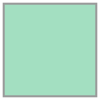

In [143]:
earthquake.geometry.values[0]

In [153]:
tpp = earthquake.geometry.values[0]
tpp.__dir__()

['_is_empty',
 '__geom__',
 '_ndim',
 '_exterior',
 '__module__',
 '__doc__',
 '_interiors',
 '__init__',
 'exterior',
 'interiors',
 '__eq__',
 '__ne__',
 '__hash__',
 'ctypes',
 '__array_interface__',
 '_get_coords',
 '_set_coords',
 'coords',
 '__geo_interface__',
 'svg',
 'from_bounds',
 '__p__',
 '_ctypes_data',
 '_crs',
 '_other_owned',
 'impl',
 '_lgeos',
 'empty',
 '__bool__',
 '__nonzero__',
 '__del__',
 '__str__',
 '__reduce__',
 '__setstate__',
 '_geom',
 '__and__',
 '__or__',
 '__sub__',
 '__xor__',
 'array_interface_base',
 'xy',
 'geometryType',
 'type',
 'to_wkb',
 'to_wkt',
 'wkt',
 'wkb',
 'wkb_hex',
 '_repr_svg_',
 'geom_type',
 'area',
 'distance',
 'hausdorff_distance',
 'length',
 'boundary',
 'bounds',
 'centroid',
 'representative_point',
 'convex_hull',
 'envelope',
 'minimum_rotated_rectangle',
 'buffer',
 'simplify',
 'difference',
 'intersection',
 'symmetric_difference',
 'union',
 'has_z',
 'is_empty',
 'is_ring',
 'is_closed',
 'is_simple',
 'is_valid',
 '

In [173]:
xs = str(tpp.centroid).replace('(','').split(" ")
xs

['POINT', '150.7813704909655', '-24.36422730799995)']

In [178]:
float(xs[2][:-1])

-24.36422730799995

In [145]:
earthquake = geopandas.read_file('LandSat8_Loc34300_g731.json')
plyname = earthquake.geometry.values[0]
plot_in_poly(plyname,10)

TypeError: plot_in_poly() missing 1 required positional argument: 'pname'

In [148]:
type(npolt)

shapely.geometry.polygon.Polygon

In [149]:
type(plyname)

shapely.geometry.polygon.Polygon

---------lbrt-------------
152.1 -28.9 153.9 -27.1


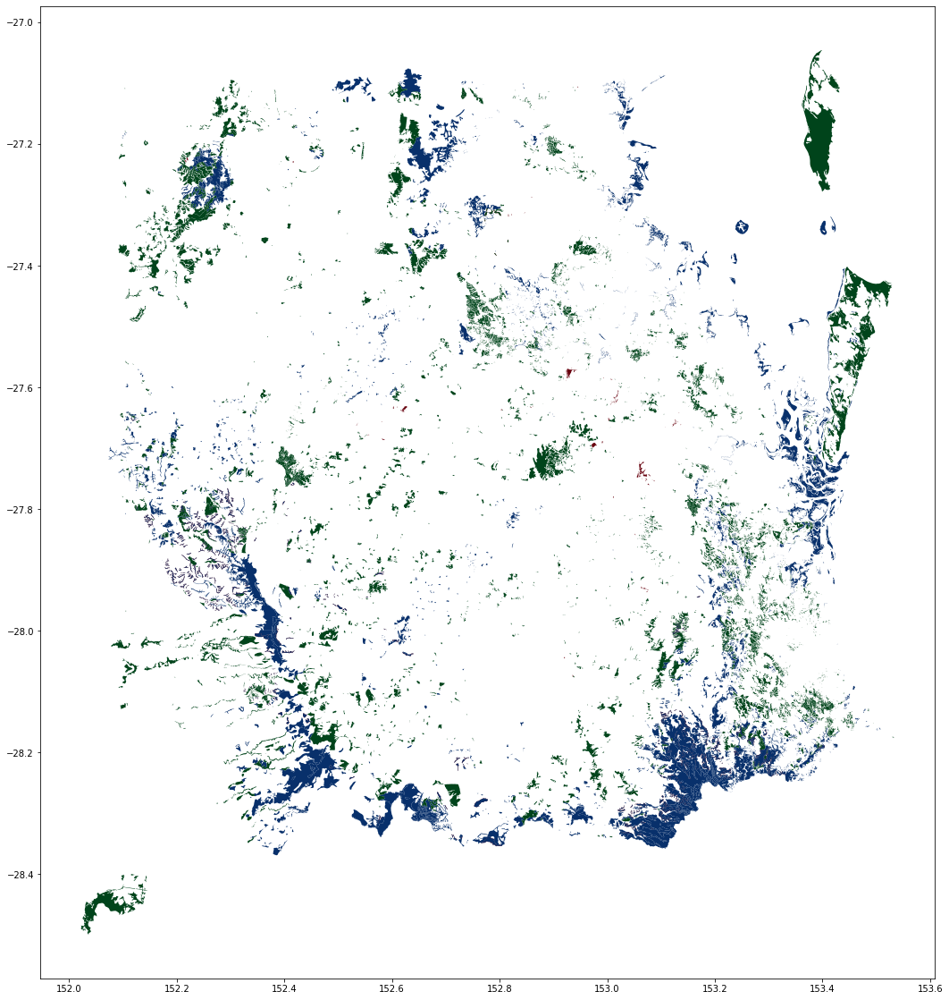

In [71]:
npol2 = point2rect(153.0,-28.0,0.9)
plot_in_poly(npol2,20)

gj = geopandas.GeoSeries([npol2]).to_json()

f = open('/Users/brian/Desktop/LandSat8_None.json', 'w')
f.write(gj)
f.close()

---------lbrt-------------
152.39999999999998 -28.6 153.0 -28.0


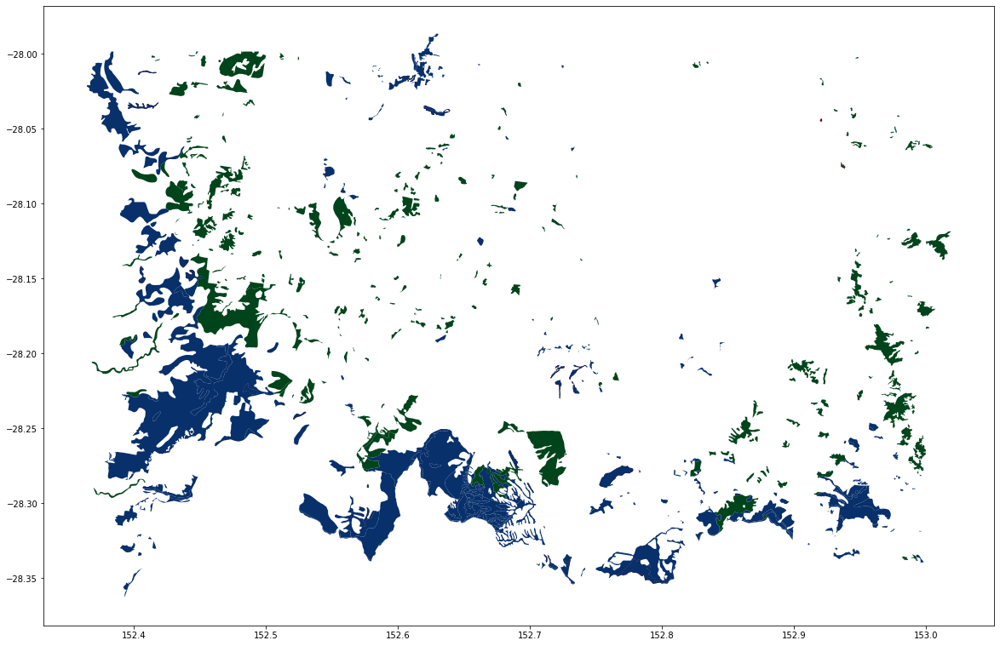

In [76]:
npol2 = point2rect(152.7,-28.3,0.3)
plot_in_poly(npol2,20)

gj = geopandas.GeoSeries([npol2]).to_json()

f = open('/Users/brian/Desktop/LandSat8_MountBarney.json', 'w')
f.write(gj)
f.close()

---------lbrt-------------
146.6 -22.4 148.4 -20.6


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


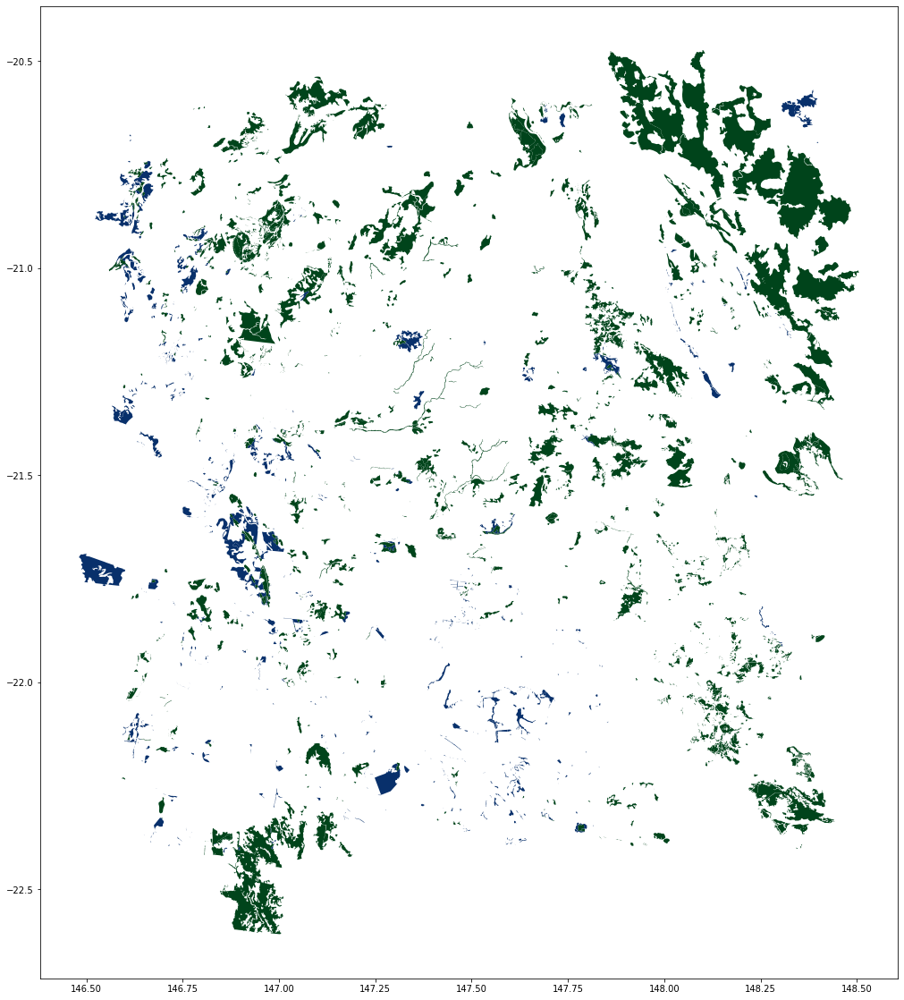

In [59]:
npol2 = point2rect(147.5,-21.5,0.9)
plot_in_poly(npol2,20)

---------lbrt-------------
148.15 -20.75 148.54999999999998 -20.35


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


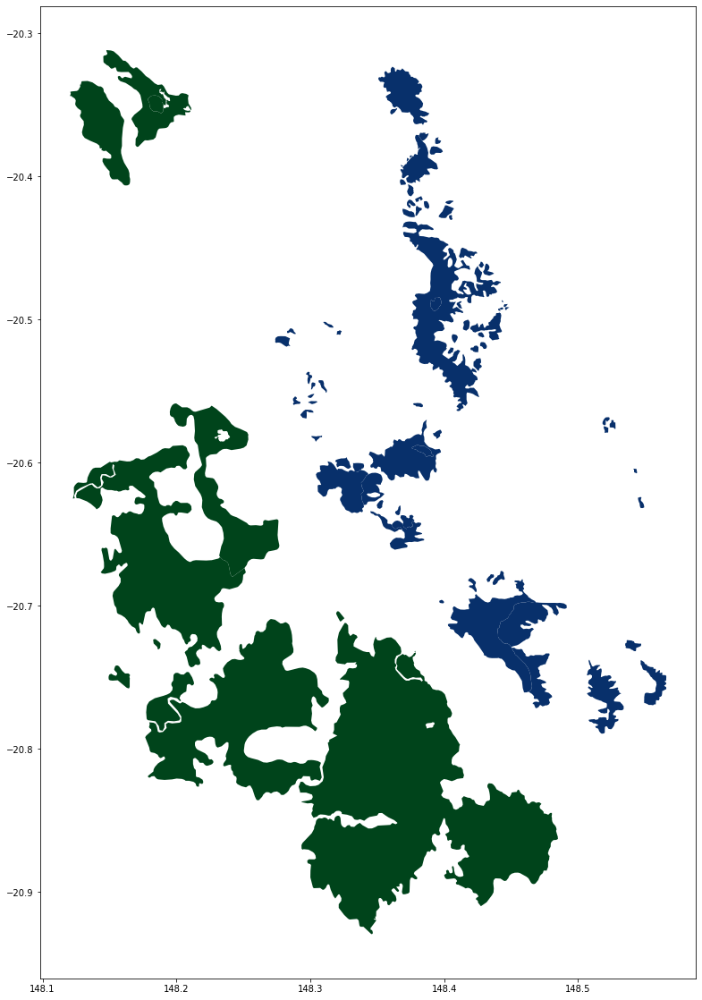

In [79]:
npol2 = point2rect(148.35,-20.55,0.2)
plot_in_poly(npol2,20)


gj = geopandas.GeoSeries([npol2]).to_json()

f = open('/Users/brian/Desktop/LandSat8_Andromache.json', 'w')
f.write(gj)
f.close()

---------lbrt-------------
147.8 -21.45 148.2 -21.05


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


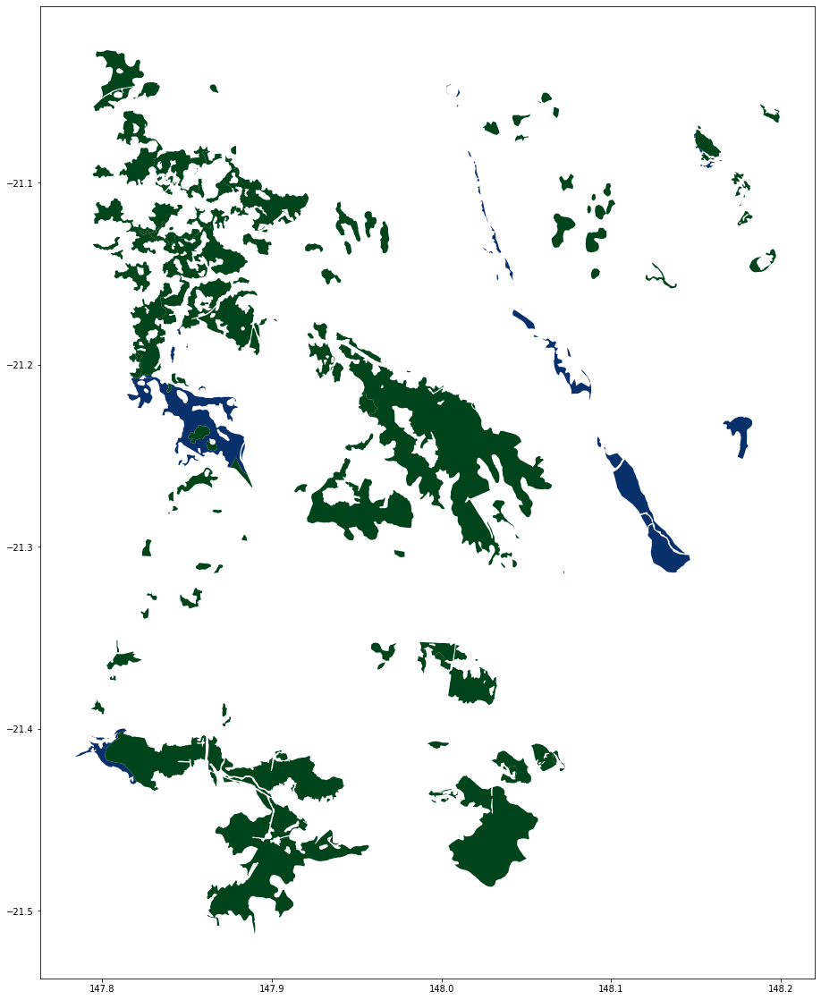

In [69]:
npol2 = point2rect(148.0,-21.25,0.2)
plot_in_poly(npol2,20)


gj = geopandas.GeoSeries([npol2]).to_json()

f = open('/Users/brian/Desktop/LandSat8_Newlands.json', 'w')
f.write(gj)
f.close()

---------lbrt-------------
146.55 -21.05 146.95 -20.650000000000002


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


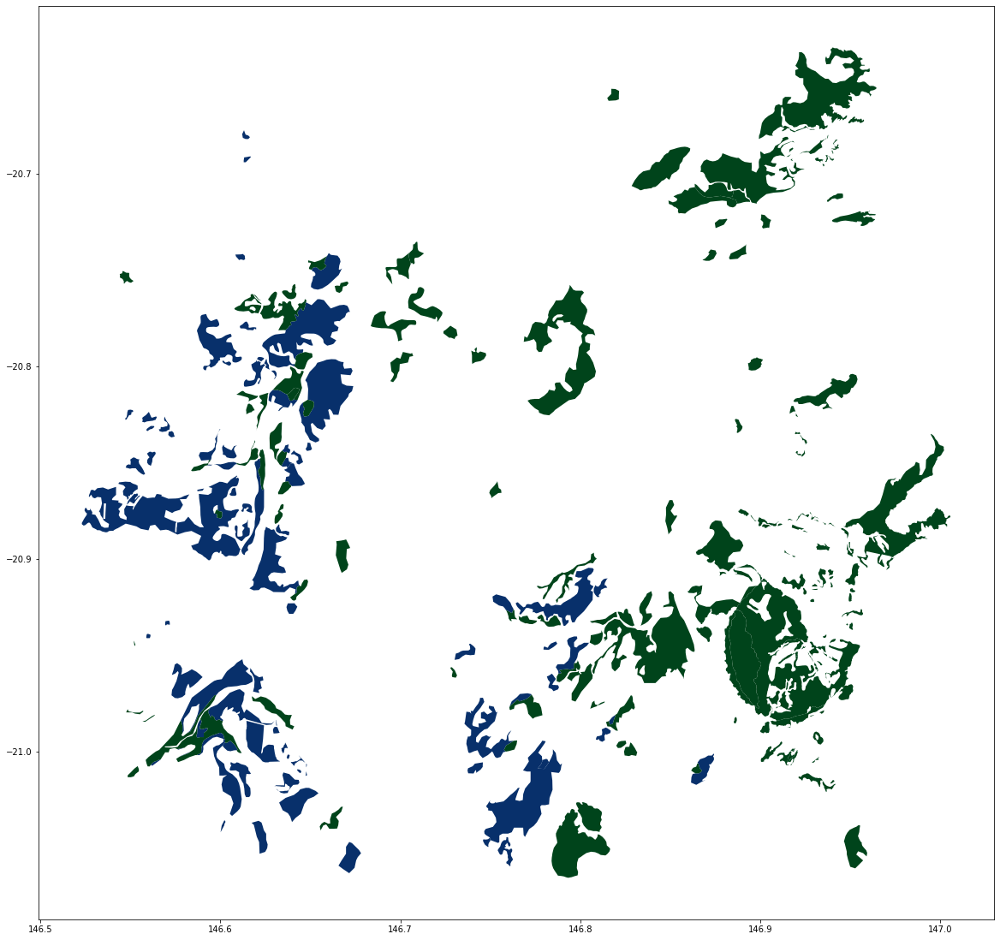

In [65]:
npol2 = point2rect(146.75,-20.85,0.2)
plot_in_poly(npol2,20)

---------lbrt-------------
146.8 -21.95 147.2 -21.55


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


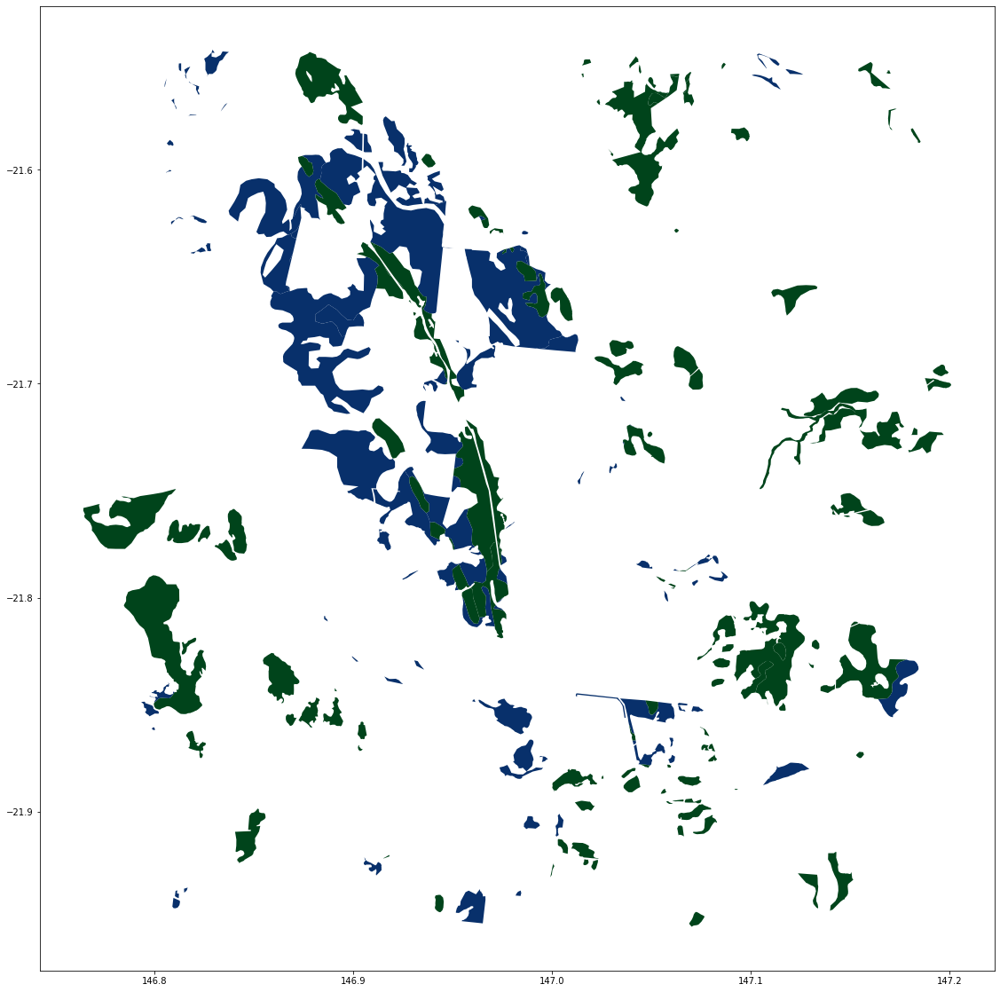

In [68]:
npol2 = point2rect(147.0,-21.75,0.2)
plot_in_poly(npol2,20)

gj = geopandas.GeoSeries([npol2]).to_json()

f = open('/Users/brian/Desktop/LandSat8_Belyando.json', 'w')
f.write(gj)
f.close()

In [32]:
noneuc = geopandas.read_file("Non_Eucalyptus_Reg_Ecos_2017/Non_Eucalypt_RE.shp")
euc = geopandas.read_file("Monospecies_Reg_Ecos_2017/FF_SingleSp_RE_2017_V11.shp")
eucmg = geopandas.read_file("Monogenus_Monotribe_Eucalypt_Reg_Ecos_2017/Monotribe_Eucalypt_REs_2017_100pct.shp")
eucmgs = eucmg[['RE', 'Descriptio', 'geometry']].copy()
noneucs = noneuc[['RE', 'Descriptio', 'geometry']].copy()
eucs = euc[['QLD_REG_EC','FF_singl_1','geometry']].copy()
eucs.rename(columns={'QLD_REG_EC': 'RE', 'FF_singl_1': 'Descriptio', 'geometry': 'geometry'}, inplace=True)
eucs['euc'] = 1
eucmgs['euc'] = 1
noneucs['euc'] = 0
merged = eucs.append(eucmgs,sort=False)
fpdf = merged.append(noneucs,sort=False)

In [56]:
def point2rect(lon,lat,inc):
    l = lon - inc
    b = lat - inc
    r = lon + inc 
    t = lat + inc
    #print("---------lbrt-------------")
    #print(l,b,r,t)                                  
    spoly = Polygon([(l,t),(l,b),(r,b),(r,t),(l,t)])
    return(spoly)

In [22]:
npol = point2rect(148.5,-21.0,0.2)

---------lbrt-------------
148.3 -21.2 148.7 -20.8


In [57]:
def point2rect(lon,lat,inc):
    l = lon - inc
    b = lat - inc
    r = lon + inc 
    t = lat + inc
    #print("---------lbrt-------------")
    #print(l,b,r,t)                                  
    spoly = Polygon([(l,t),(l,b),(r,b),(r,t),(l,t)])
    return(spoly)

def plot_in_poly(poly,fg):
    subset2m = eucmg[eucmg.intersects(poly)]
    subset2 = euc[euc.intersects(poly)]
    subset2ne = noneuc[noneuc.intersects(poly)]
    ax = subset2.plot(color='white',figsize=(fg,fg))

    cmap_reds=plt.cm.get_cmap('Reds', 2)
    cmap_blues=plt.cm.get_cmap('Blues', 2)
    cmap_greens=plt.cm.get_cmap('Greens', 2)

    subset2x = subset2
    subset2x.plot(ax=ax,color=cmap_reds(2),figsize=(fg,fg))

    subset2x = subset2ne
    subset2x.plot(ax=ax,color=cmap_blues(2),figsize=(fg,fg))

    subset2x = subset2m
    subset2x.plot(ax=ax,color=cmap_greens(2),figsize=(fg,fg))

---------lbrt-------------
148.3 -21.2 148.7 -20.8


/usr/local/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


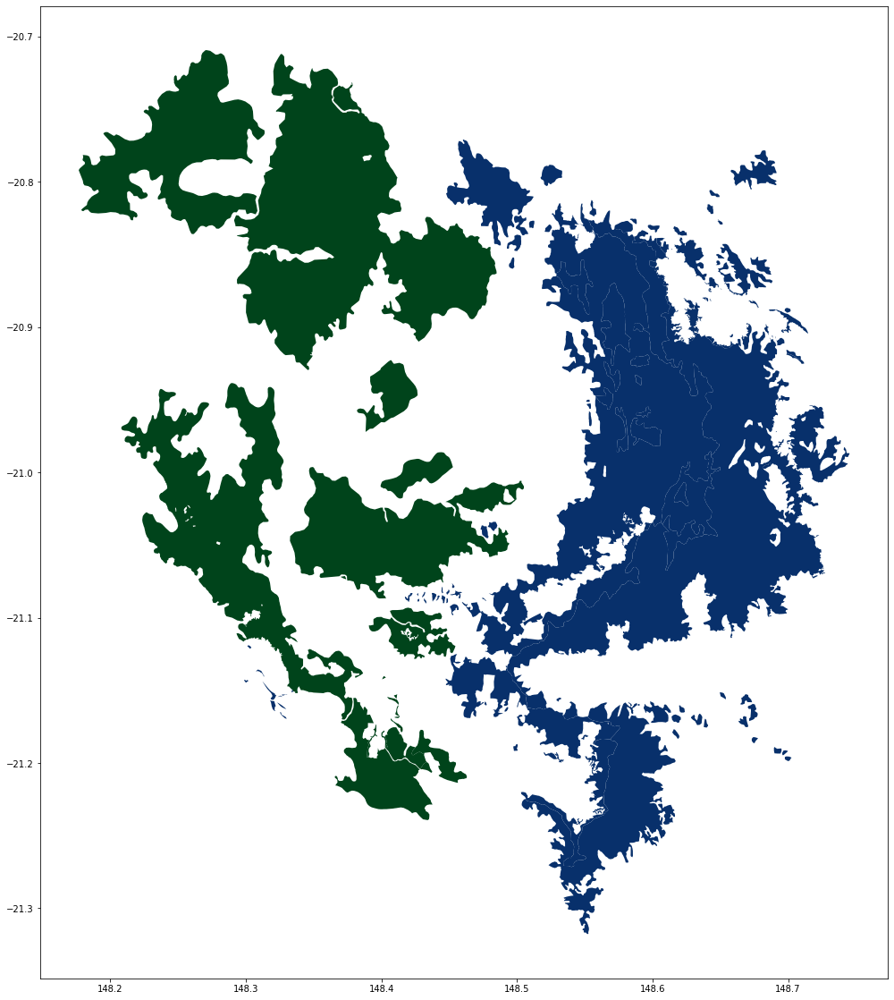

In [67]:
npol = point2rect(148.5,-21.0,0.2)
plot_in_poly(npol,20)
gj = geopandas.GeoSeries([npol]).to_json()

f = open('/Users/brian/Desktop/herberton_Landsat8.json', 'w')
f.write(gj)
f.close()

In [25]:
def poly2gjson(poly,fname):
    gj = geopandas.GeoSeries([npol]).to_json()
    text_file = open(fname, "w")
    n = text_file.write(gj)
    text_file.close()

In [26]:
poly2gjson(npol,"npol.json")

In [ ]:
#https://landsat-pds.s3.amazonaws.com/c1/L8/139/045/LC08_L1TP_139045_20170304_20170316_01_T1/index.html

In [ ]:
#LC80930752019291LGN00

In [47]:
%run create_training_polygons
%run filmstrip

ready...
ready...


In [30]:
rpath = "/Users/brian/code/Eucalyptus_GLMClassifier/eugenella.json/0281ee87-d0b4-4d22-9fcc-e93d39f47398/Landsat8L1G/"
stem = "LC08_L1TP_093075_20191018_20191029"
fntag = "eugella"
ls2envi_full(rpath,stem,fntag)

sds = gdal.Open("/Users/brian/code/Eucalyptus_GLMClassifier/"+fntag+"_reflectance_full.tif")
driver = gdal.GetDriverByName('ENVI')
dst = driver.CreateCopy("/Users/brian/code/Eucalyptus_GLMClassifier/"+fntag+"_reflectance_full.bil",sds)
dst = None
spy_image_eugella = envi.open("/Users/brian/code/Eucalyptus_GLMClassifier/"+fntag+"_reflectance_full.hdr",
                      image="/Users/brian/code/Eucalyptus_GLMClassifier/"+fntag+"_reflectance_full.bil")

In [33]:
subset2mi = fpdf[fpdf.intersects(npol)]
len(subset2mi)

155

In [40]:
hsf_eugella = "/Users/brian/code/Eucalyptus_GLMClassifier/eugella_reflectance_full.tif"
#hnon = xkpls_m(hsf,spy_image,8,subset2mi,4326,4283,32655,0,441,0,745,zgz)
hnon_eugella = xkpls_m(hsf_eugella,spy_image_eugella,8,subset2mi,4326,4283,32655,0,1490,0,1400,zgz)

------ xkpls_m
------src.ref_____
EPSG:32655
---------lbrt-------------
634935.0 -2345235.0 676935.0 -2300535.0
---------spoly-------------
POLYGON ((634935 -2300535, 634935 -2345235, 676935 -2345235, 676935 -2300535, 634935 -2300535))
image pixel dimensions:
(1490, 1400, 12)


/usr/local/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/usr/local/lib/python3.7/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/usr/local/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axi

xpoly.bounds: (634935.0, -2345235.0, 676935.0, -2300535.0)
chd:44700.0 cwd:42000.0
poly number: 1
0
dfn: 155
0
hits number: 155
0 of 155
1 of 155
2 of 155
3 of 155
4 of 155
5 of 155
6 of 155
7 of 155
8 of 155
9 of 155
10 of 155
11 of 155
12 of 155
13 of 155
14 of 155
15 of 155
16 of 155
17 of 155
18 of 155
19 of 155
20 of 155
21 of 155
22 of 155
23 of 155
24 of 155
25 of 155
26 of 155
27 of 155
28 of 155
29 of 155
30 of 155
31 of 155
32 of 155
33 of 155
34 of 155
35 of 155
36 of 155
37 of 155
38 of 155
39 of 155
40 of 155
41 of 155
42 of 155
43 of 155
44 of 155
45 of 155
46 of 155
47 of 155
48 of 155
49 of 155
50 of 155
51 of 155
52 of 155
53 of 155
54 of 155
55 of 155
56 of 155
57 of 155
58 of 155
59 of 155
60 of 155
61 of 155
62 of 155
63 of 155
64 of 155
65 of 155
66 of 155
67 of 155
68 of 155
69 of 155
70 of 155
71 of 155
72 of 155
73 of 155
74 of 155
75 of 155
76 of 155
77 of 155
78 of 155
79 of 155
80 of 155
81 of 155
82 of 155
83 of 155
84 of 155
85 of 155
86 of 155
87 of 155
88

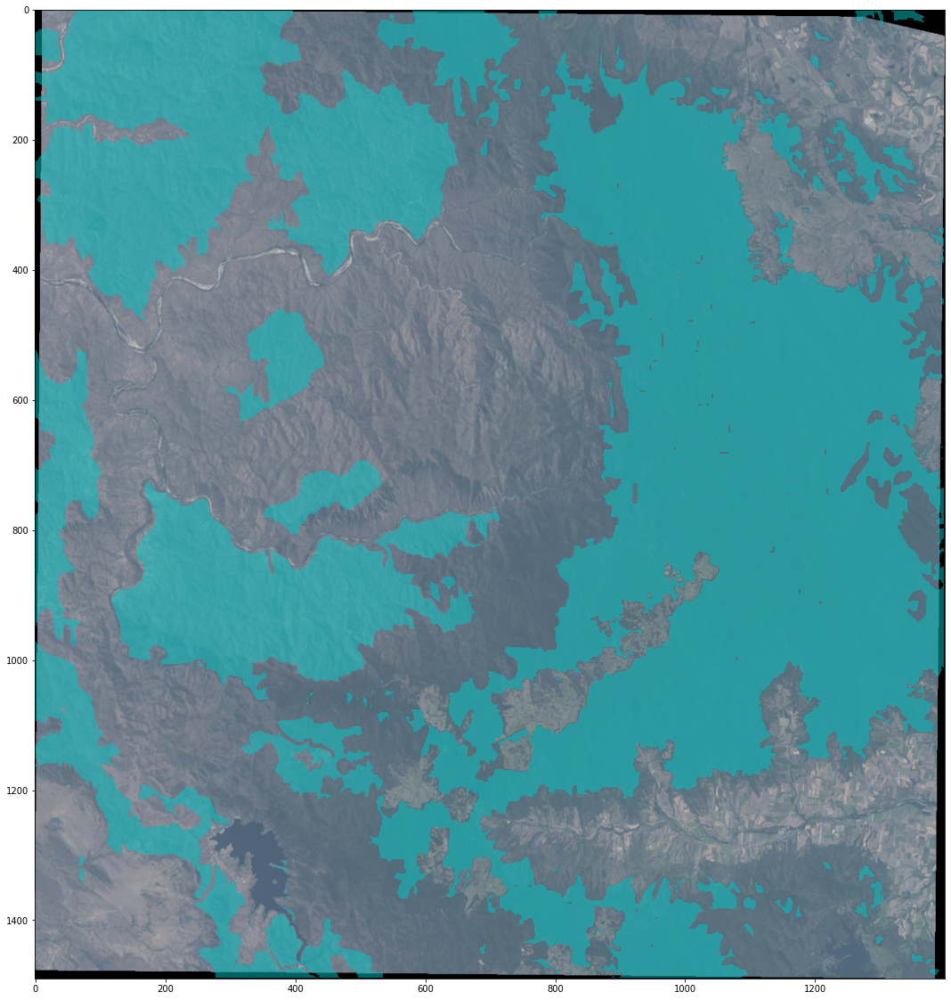

In [41]:
view = imshow(spy_image_eugella, (3, 2, 1), classes=hnon_eugella,figsize=(fg,fg))
view.set_display_mode('overlay')
view.class_alpha = 0.5

In [57]:
import spectral as spy


def classify_image(polygons, image, testper):
    tandt = split_pixels_training_testing(polygons,testper)
    training_pixels = tandt[0]
    testing_pixels = tandt[1]

    traint = spy.create_training_classes(image,training_pixels)
    gmlc1 = GaussianClassifier(traint)
    clmap1 = gmlc1.classify_image(image)

    view = imshow(image, (3, 2, 1), classes=training_pixels,figsize=(fg,fg),interpolation='none')
    view.set_display_mode('overlay')
    view.class_alpha = 1.0

    imshow(classes=clmap1,figsize=(fg,fg),interpolation='none')

    #gtresultst1 = clmap1 * (hnon != 0)
    gtresults_testing = clmap1 * (testing_pixels != 0)
    unique, counts = np.unique(gtresults_testing, return_counts=True)

    v = imshow(classes=gtresults_testing,figsize=(fg,fg),interpolation='none')
    testing_errors2 = gtresults_testing * (gtresults_testing != testing_pixels)
    unique, counts = np.unique(testing_errors2, return_counts=True)

    imshow(classes=testing_errors2,figsize=(fg,fg),interpolation='none')
    classification_metrics(testing_pixels,gtresults_testing)

spectral:INFO: Setting min samples to 12


Covariance.....  0.0Covariance.....  0.0Covariance.....done  
Covariance.....  0.0Covariance.....  0.0Covariance.....done  
Classifying image...  0.Classifying image...  1.Classifying image...  2.Classifying image...  3.Classifying image...  4.Classifying image...  5.Classifying image...  6.Classifying image...  7.Classifying image...  8.Classifying image...  9.Classifying image... 10.Classifying image... 11.Classifying image... 12.Classifying image... 13.Classifying image... 14.Classifying image... 15.Classifying image... 16.Classifying image... 17.Classifying image... 18.Classifying image... 19.Classifying image... 20.Classifying image... 21.Classifying image... 22.Classifying image... 23.Classifying image... 24.Classifying image... 25.Classifying image... 26.Classifying image... 27.Classifying image... 28.Classifying image... 29.Classifying image... 30.Classifying image... 31.Classifying image... 32.Classifying image... 33.Classifying image... 34.Classifying image... 35.Classifying 

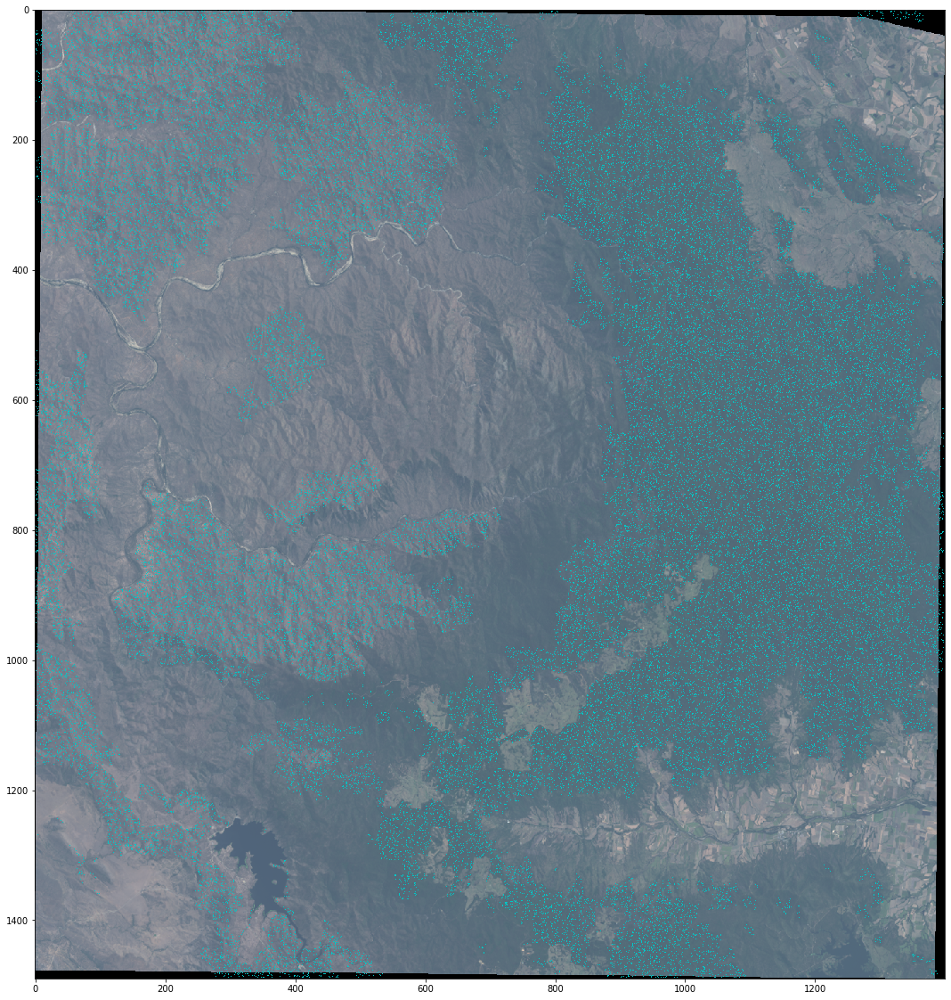

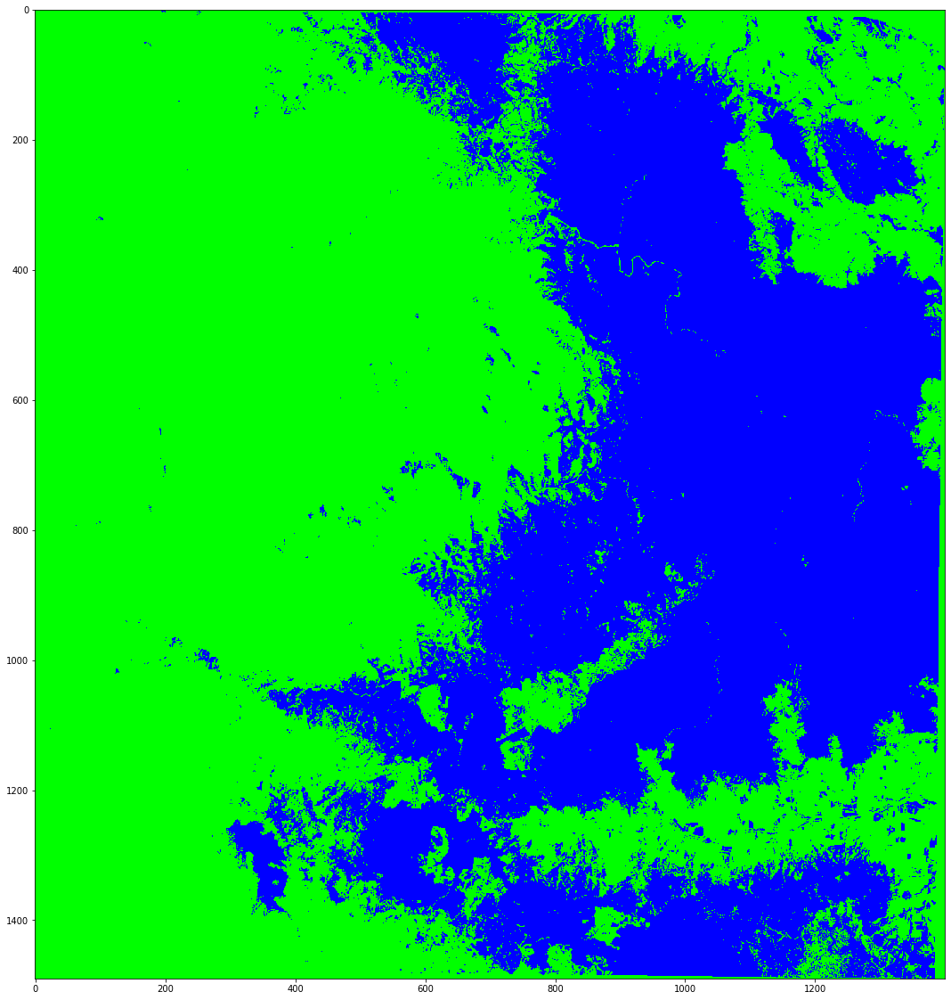

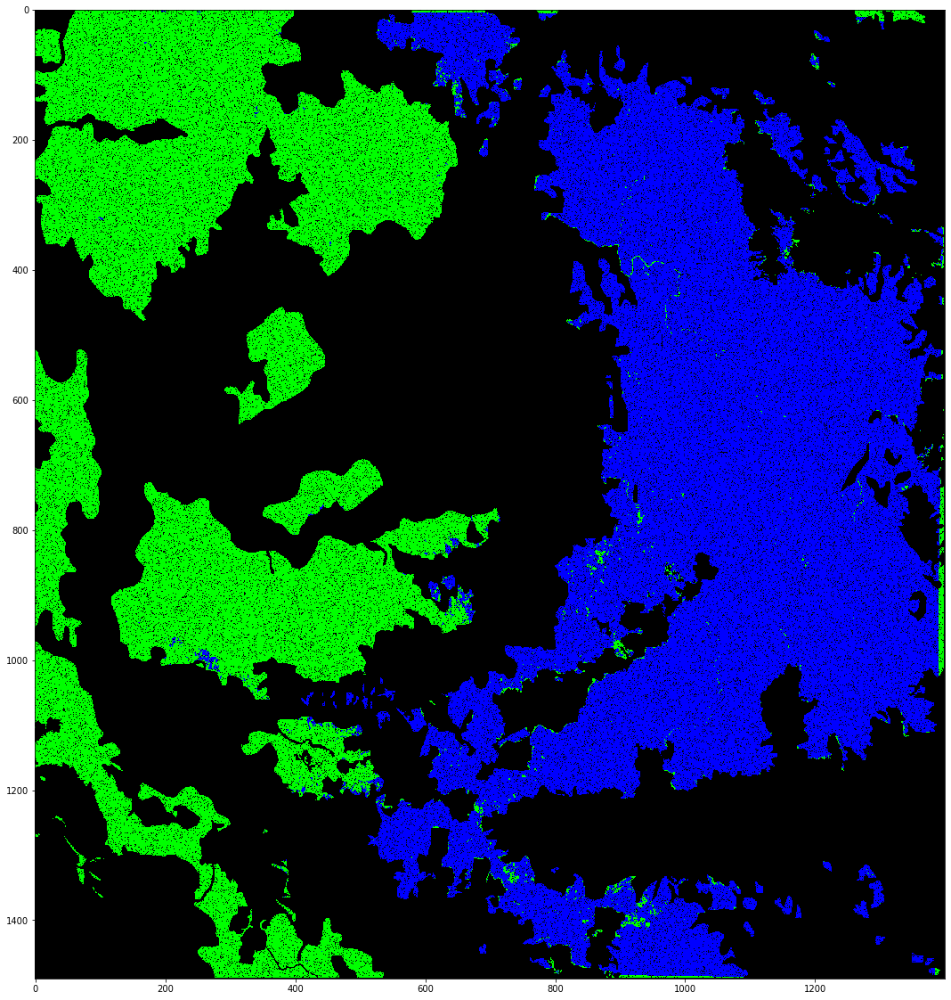

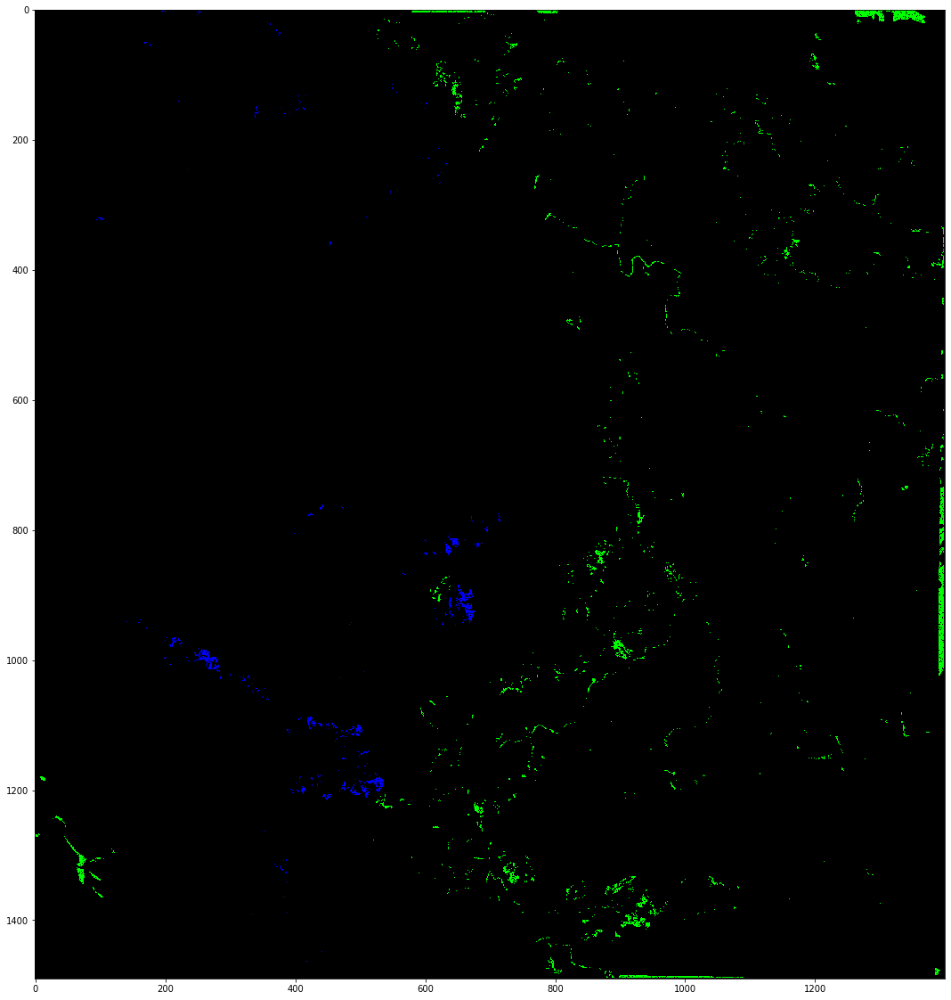

In [58]:
classify_image(hnon_eugella,spy_image_eugella,0.1)

In [45]:
import spectral as spy

spectral:INFO: Setting min samples to 12


ready...
Covariance.....  0.0Covariance.....  0.0Covariance.....done  
Covariance.....  0.0Covariance.....  0.0Covariance.....done  
Classifying image...  0.Classifying image...  1.Classifying image...  2.Classifying image...  3.Classifying image...  4.Classifying image...  5.Classifying image...  6.Classifying image...  7.Classifying image...  8.Classifying image...  9.Classifying image... 10.Classifying image... 11.Classifying image... 12.Classifying image... 13.Classifying image... 14.Classifying image... 15.Classifying image... 16.Classifying image... 17.Classifying image... 18.Classifying image... 19.Classifying image... 20.Classifying image... 21.Classifying image... 22.Classifying image... 23.Classifying image... 24.Classifying image... 25.Classifying image... 26.Classifying image... 27.Classifying image... 28.Classifying image... 29.Classifying image... 30.Classifying image... 31.Classifying image... 32.Classifying image... 33.Classifying image... 34.Classifying image... 35.Cla

<Figure size 432x288 with 0 Axes>

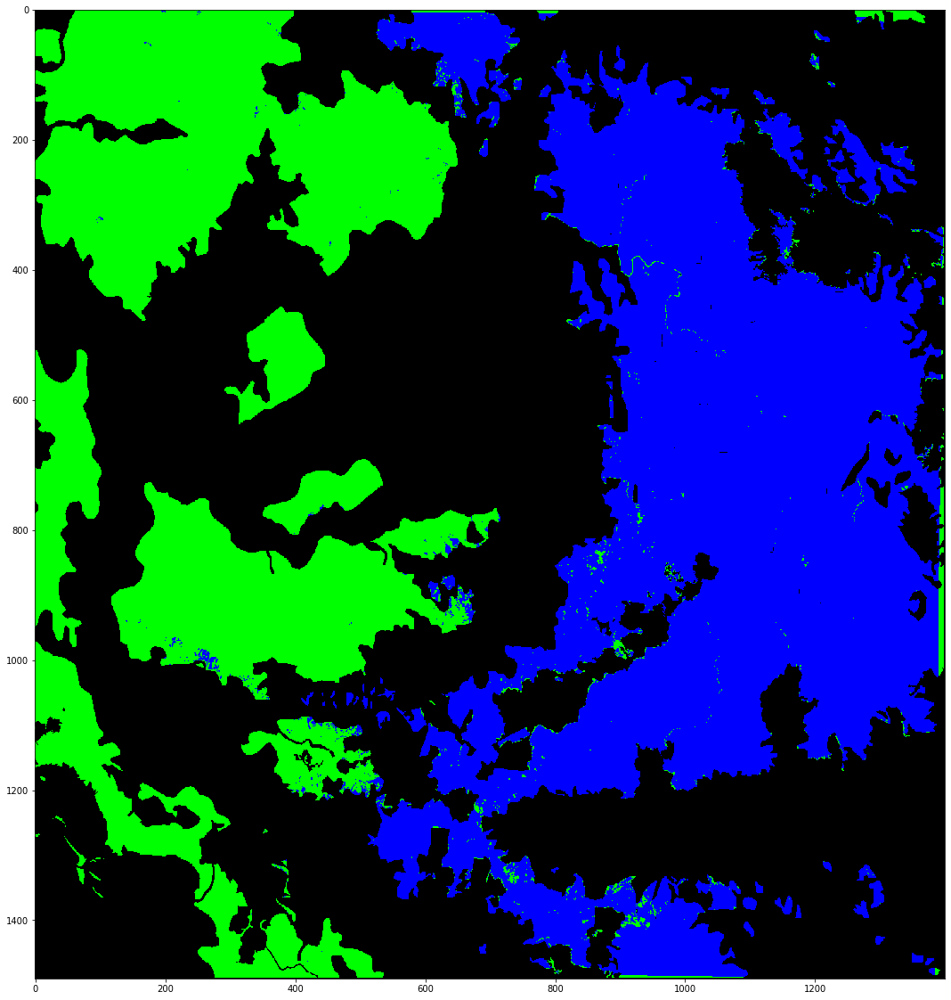

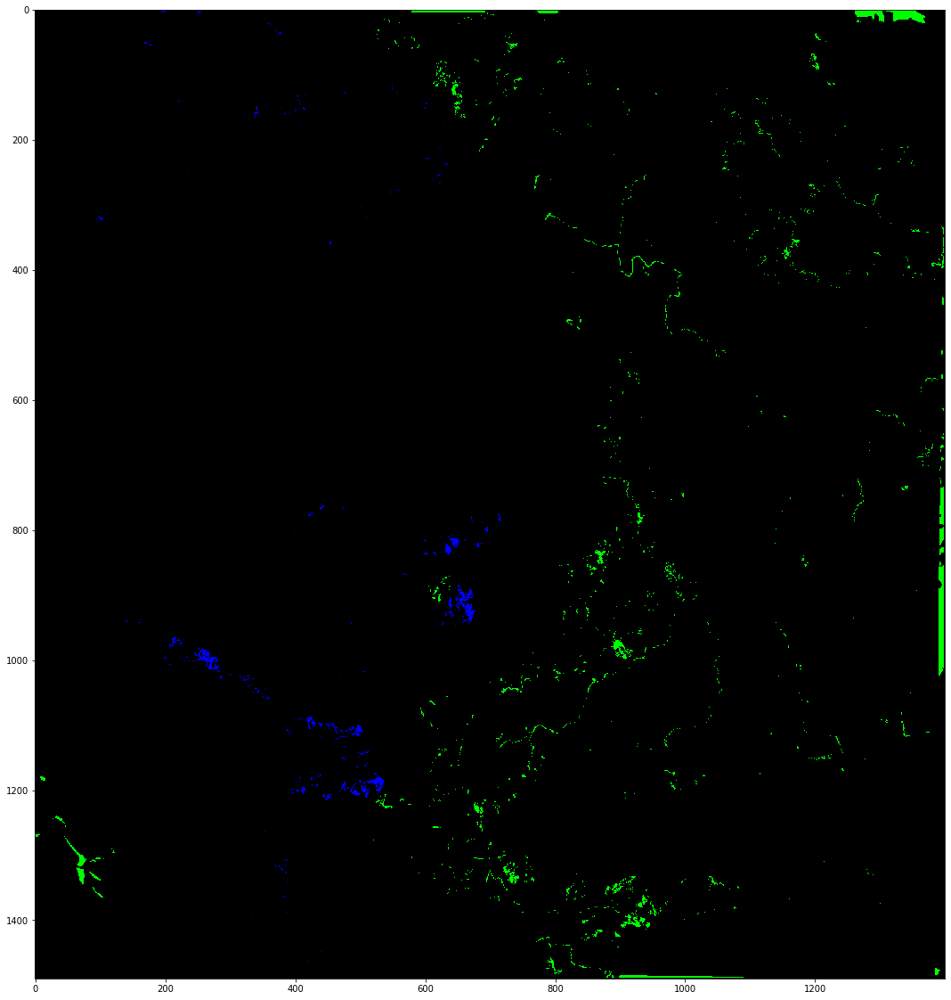

In [51]:
%run create_training_polygons
train_and_apply(hnon_eugella,hnon_eugella,spy_image_eugella,spy_image_eugella,20)